In [9]:
import os
import glob

import pandas as pd
import pytz
import datetime as dt
import math
import seaborn as sns
import matplotlib as mpl
#mpl.rcParams['path.simplify'] = False
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns


In [10]:

# style settings
sns.set(style='whitegrid', rc={'axes.facecolor': '#EFF2F7'})

## Related functions

In [11]:
def read_manipulate_psychopy(psychopy_path):
    
    psychopy_df = pd.read_csv(psychopy_path)
    col_list = [col for col in psychopy_df.columns if col.endswith('_ts')]
    col_list.insert(0, "Reference_time")
    psychopy_df_selected = psychopy_df[col_list]
    
    return psychopy_df_selected


def get_nonNan_list_psychopy(psychopy_df, col_name):
    
    
    selected_vals=[val for val in psychopy_df[col_name].to_list() if not(math.isnan(val))]
    
    return selected_vals


def get_offset_timestamp(timestamp, offset_mins):
    
    time_zone = 'Europe/Berlin'
    tz = pytz.timezone(time_zone)
    local_time = dt.datetime.fromtimestamp(timestamp, tz)
    time_change = dt.timedelta(minutes=offset_mins)
    new_time = local_time + time_change
    new_timestamp =  dt.datetime.timestamp(new_time)
    return new_timestamp


def read_shimmer_sensor(sensor_file_path):
    
    shimmer_df = pd.read_csv(sensor_file_path, sep='\t', low_memory=False)
    shimmer_df = shimmer_df.reset_index()
    shimmer_df.columns = shimmer_df.iloc[0]
    shimmer_df.drop([0, 1], axis=0, inplace=True)
    shimmer_df=shimmer_df.reset_index(drop=True)
    
    return shimmer_df


def slice_df_wrt_timestamps(df, start_timestamp, end_timestamp, timestamps_col):
    
    sliced_df=df[(df[timestamps_col]>= start_timestamp) & (df[timestamps_col] <= end_timestamp)]
    
    return sliced_df


def standardize_timestamps_shimmer(shimmer_df, timestamps_col_name):
    
    timesstamps_list = shimmer_df[timestamps_col_name].to_list()
    new_timestamps_list = [float(val)/1000 for val in  timesstamps_list]
    
    shimmer_df[timestamps_col_name] = new_timestamps_list
    
    return shimmer_df


def mean_std_col_df (df, col_name):
    
    col_list = df[col_name].to_list()
    
    cols_list_float = [float(val) for val in col_list]
    
    cols_list_float_np =np.array(cols_list_float)
    
    mean_col= np.mean(cols_list_float_np)
    std_col = np.std(cols_list_float_np)
    
    return mean_col, std_col


def plot_mean_std(mean_list, std_list, label_list, title_figure, y_label_fig):
    x_pos = np.arange(len(label_list))
    fig, ax = plt.subplots()
    ax.bar(x_pos, mean_list, yerr=std_list, align='center', alpha=0.5, capsize=10 )
    ax.set_ylabel(y_label_fig)
    ax.set_xticks(x_pos)
    ax.set_xticklabels(label_list, rotation=45, ha='right', rotation_mode='anchor')
    #title_ax = "VP001_251023_Session1_Shimmer_FBA7_Calibrated_SD"
    ax.set_title(title_figure)
    ax.yaxis.grid(True)
    #plt.ylim(0, 1) 
    plt.tight_layout()
    plt.show()
    return fig
    
    
def print_start_end_time(timestamp_col):
    
    time_stamp_list = timestamp_col.values
    start_timestamp = time_stamp_list[0]
    last_timestamp  = time_stamp_list[-1]
    
    time_zone = 'Europe/Berlin'
    tz = pytz.timezone(time_zone)
    
    start_time = dt.datetime.fromtimestamp(start_timestamp, tz)
    end_time  = dt.datetime.fromtimestamp(last_timestamp, tz)
    
    print("start time:" + str(start_time))
    print("end time:" + str(end_time))
    
    
    

def get_mean_std_event_list(psychopy_df, shimmer_df_selected, event_interest_list_new, offset_min_list_new, timestamp_sensor_col_name, data_col_name):

    mean_cumm_list = []
    std_cumm_list  = []
    event_interets_plot = []


    ##---outer loop to hnadle muultiple offsets from the selected events 
    for ind, event_selected in enumerate(event_interest_list_new):

        offset_list_selected_event = offset_min_list_new[ind]

        print(event_selected)

        current_event_timestamp = get_nonNan_list_psychopy(psychopy_df, event_selected)[0]

        offset_min_list_selected = offset_min_list_new[ind]
        
        acc_min_print = 0

        for offset_min in offset_min_list_selected:
            
            offset_min_print = offset_min + acc_min_print
            
            acc_min_print = offset_min_print

            event_plot = event_selected +" "+ str(offset_min_print) + " min"
            event_interets_plot.append(event_plot)

            timestamp_offset = get_offset_timestamp(current_event_timestamp, offset_min)

            start_end_time_list = [current_event_timestamp, timestamp_offset]

            timestamp_start_slice = min(start_end_time_list)

            timestamp_end_slice = max(start_end_time_list)

            sensor_df_ii=slice_df_wrt_timestamps(shimmer_df_selected, timestamp_start_slice, timestamp_end_slice, timestamp_sensor_col_name)

            mean_val, std_val = mean_std_col_df(sensor_df_ii, data_col_name) 
            mean_cumm_list.append(mean_val)
            std_cumm_list.append(std_val)




            current_event_timestamp = timestamp_offset
            
            
            
    return mean_cumm_list, std_cumm_list, event_interets_plot


def normalize_data (std_df, signal_col):
    
    
    signal = std_df[signal_col].to_list()
    
    
    signal_float =[float(val) for val in signal]
    
    signal_float_np = np.array(signal_float)
    
    
    mean_signal = np.mean(signal_float_np)
    
    mean_sub = signal_float_np - mean_signal
    
    scaled_data =  mean_sub/np.max(np.abs(mean_sub))
    
    std_df["mean_norm"] = scaled_data
    
    return std_df


def normalize_data_min_max (std_df, signal_col):
    
    
    signal = std_df[signal_col].to_list()
    
    
    signal_float =[float(val) for val in signal]
    
    signal_float_np = np.array(signal_float)
    
    
    min_val = np.min(signal_float_np)
    max_val = np.max(signal_float_np)
    
    range_val = max_val-min_val
    
    
    min_sub = signal_float_np - min_val
    
    scaled_data = min_sub/range_val
    
    
    std_df["min_max_norm"] = scaled_data
    
    return std_df
    





In [4]:
def get_mean_std_event_list_new(psychopy_df, shimmer_df_selected, event_interest_list_new, offset_min_list_new, timestamp_sensor_col_name, data_col_name):

    mean_cumm_list = []
    std_cumm_list  = []
    event_interets_plot = []


    ##---outer loop to hnadle muultiple offsets from the selected events 
    for ind, event_selected in enumerate(event_interest_list_new):

        offset_list_selected_event = offset_min_list_new[ind]

        print(event_selected)

        current_event_timestamp = get_nonNan_list_psychopy(psychopy_df, event_selected)[0]

        offset_min_list_selected = offset_min_list_new[ind]
        
        acc_min_print = 0
        
        if event_selected=="saliva_probe_3_ts":
            timestamp_offset_minus=get_offset_timestamp(current_event_timestamp,offset_min_list_selected[0])
            timestamp_offset_plus = get_offset_timestamp(current_event_timestamp, offset_min_list_selected[1])
            
            start_end_time_list = [timestamp_offset_minus, timestamp_offset_plus]
            timestamp_start_slice = min(start_end_time_list)
            timestamp_end_slice = max(start_end_time_list)
            event_plot = str(offset_min_list_selected[0])+ " min "+ event_selected +" "+ str(offset_min_list_selected[1]) + " min"
            event_interets_plot.append(event_plot)
            print(event_plot)
            
            sensor_df_ii=slice_df_wrt_timestamps(shimmer_df_selected, timestamp_start_slice, timestamp_end_slice, timestamp_sensor_col_name)
            
            mean_val, std_val = mean_std_col_df(sensor_df_ii, data_col_name)
            
            mean_cumm_list.append(mean_val)
            std_cumm_list.append(std_val)
            
            
        else:
            
            

            for offset_min in offset_min_list_selected:

                offset_min_print = offset_min + acc_min_print

                acc_min_print = offset_min_print

                event_plot = event_selected +" "+ str(offset_min_print) + " min"
                event_interets_plot.append(event_plot)

                timestamp_offset = get_offset_timestamp(current_event_timestamp, offset_min)

                start_end_time_list = [current_event_timestamp, timestamp_offset]

                timestamp_start_slice = min(start_end_time_list)

                timestamp_end_slice = max(start_end_time_list)

                sensor_df_ii=slice_df_wrt_timestamps(shimmer_df_selected, timestamp_start_slice, timestamp_end_slice, timestamp_sensor_col_name)

                mean_val, std_val = mean_std_col_df(sensor_df_ii, data_col_name) 
                mean_cumm_list.append(mean_val)
                std_cumm_list.append(std_val)




                current_event_timestamp = timestamp_offset
            
            
            
    return mean_cumm_list, std_cumm_list, event_interets_plot

## Paths

In [5]:
#data_dir_path = "/home/muhammad/Desktop/Datasets/data_sony_digiRelax/wp3"
data_dir_path = "/media/muhammad/d5e4618d-a960-4f0d-a521-1c804bbebbb4/data_sony_digiRelax/wp3"
sub_dirs=next(os.walk(data_dir_path))[1]
sub_dirs=sorted(sub_dirs)
print(sub_dirs)

['VP004_081123', 'VP005_081123', 'VP006_091123', 'VP007_091123', 'VP008_101123', 'VP009_101123', 'VP010_131123', 'VP011_131123', 'VP012_141123', 'VP013_151123', 'VP014_151123', 'VP015_161123', 'VP016_161123', 'VP017_171123', 'VP018_201123', 'VP019_201123', 'VP020_221123', 'VP021_221123', 'VP022_231123', 'VP023_231123', 'VP024_241123', 'VP025_271123', 'VP026_271123', 'VP027_271123', 'VP028_281123', 'VP029_281123', 'VP030_291123', 'VP031_291123', 'VP032_301123', 'VP033_301123', 'VP034_011223', 'VP035_041223', 'VP037_051223', 'VP038_051223', 'VP039_061223', 'VP040_061223', 'VP041_061223', 'VP042_071223', 'VP043_071223', 'VP044_071223', 'VP045_081223', 'VP046_081223', 'VP047_111223', 'VP048_121223', 'VP049_121223', 'VP050_131223', 'VP051_131223', 'VP052_131223', 'VP053_141223', 'VP054_141223', 'VP055_141223', 'VP056_151223', 'VP057_151223', 'VP059_181223', 'VP060_191223', 'VP061_191223', 'VP062_2111223', 'VP063_040124', 'VP064_050124', 'VP065_050124', 'VP066_080124', 'VP067_100124', 'VP068

In [6]:
#dest_path ="/home/muhammad/Desktop/Datasets/data_sony_digiRelax/wp3_tester_results"
dest_path = "/media/muhammad/d5e4618d-a960-4f0d-a521-1c804bbebbb4/data_sony_digiRelax/results_missing_subjects"
isexist = os.path.exists(dest_path)
if not isexist:
    os.makedirs(dest_path)
    print("The new directory is created")

## Psychopy events of interest and the offset/onset

In [7]:
event_interest_list_new = ["baseline_instruction_ts", "tsst_prep_ts", "tsst_pres_ts", "relaxation_prep_ts", "saliva_probe_3_ts", "saliva_probe_4_ts"]
offset_min_list_new  = [[3], [5], [5,5], [5, 5, 5],[-2.5, 2.5], [-5]]

VP004_081123_DigiRelax_Experiment_2023-11-08_10h28.36.317
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


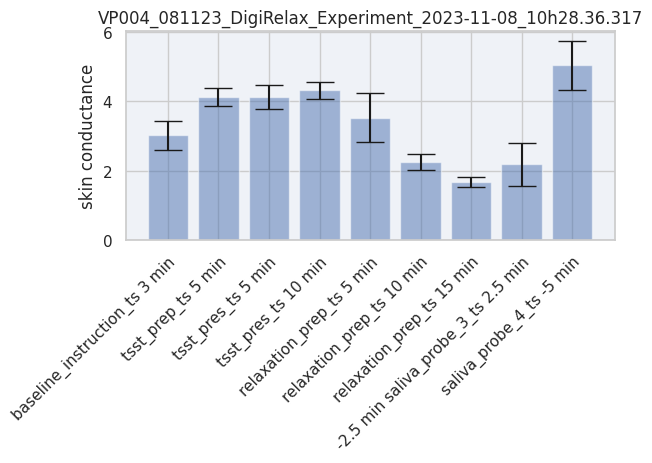

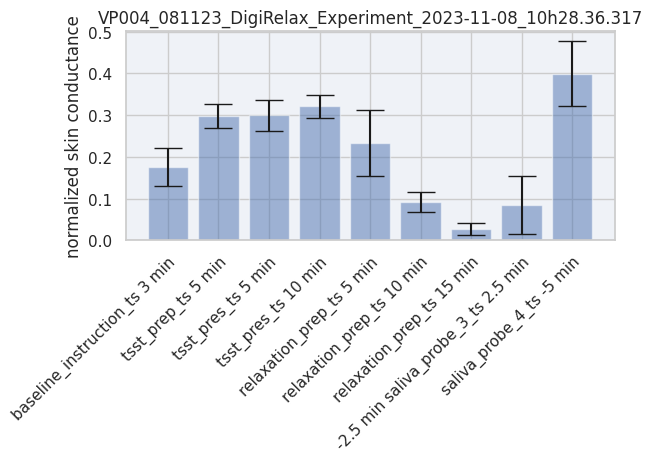

VP005_081123_DigiRelax_Experiment_2023-11-08_14h17.35.226
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


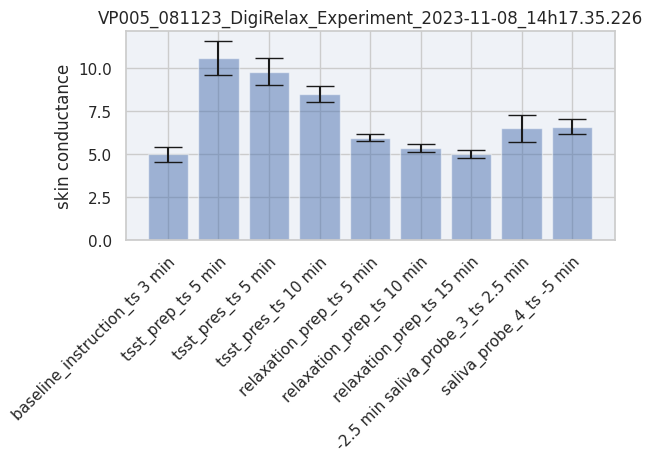

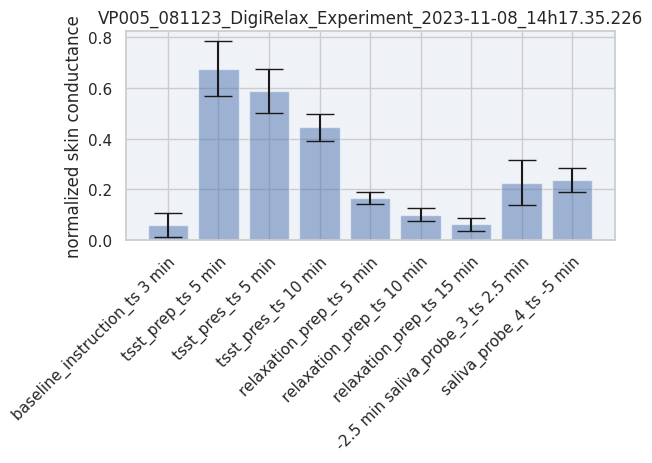

VP006_091123_DigiRelax_Experiment_2023-11-09_10h17.40.415
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


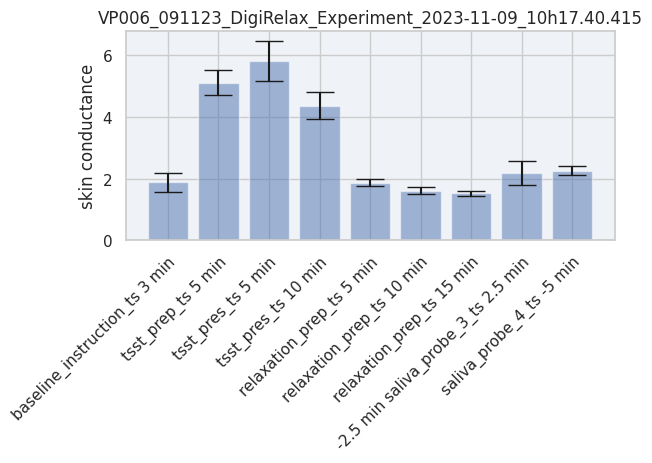

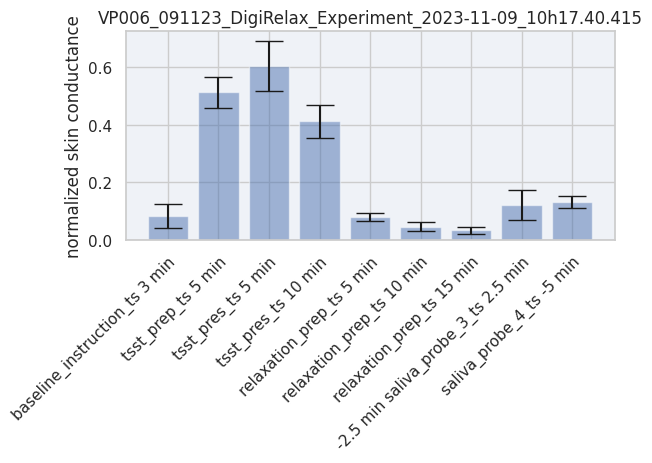

VP007_091123_DigiRelax_Experiment_2023-11-09_14h19.56.411
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


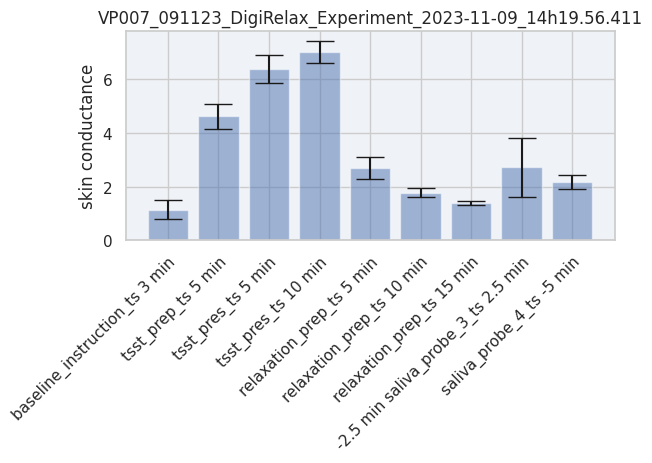

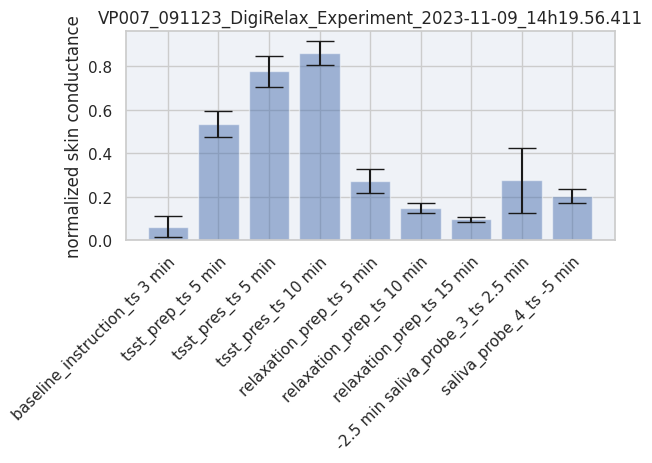

VP008_101123_DigiRelax_Experiment_2023-11-10_10h24.14.323
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


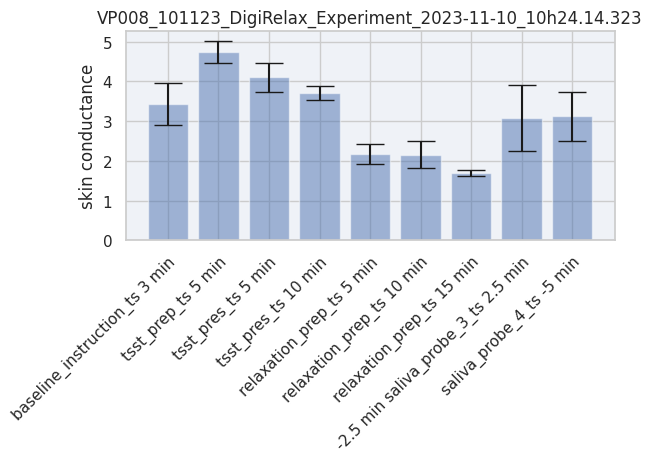

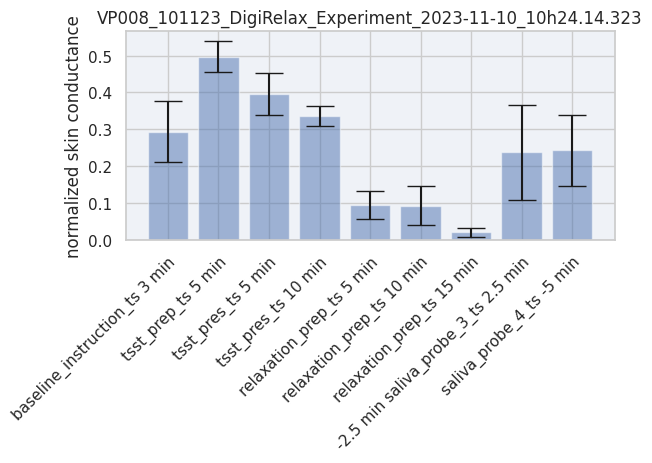

VP009_101123_DigiRelax_Experiment_2023-11-10_14h16.47.223
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


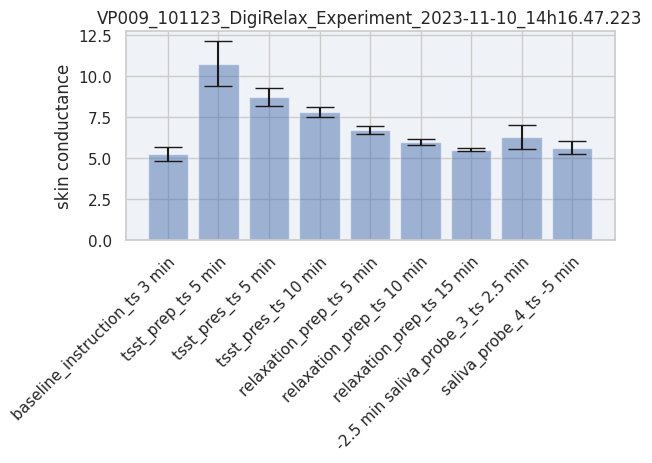

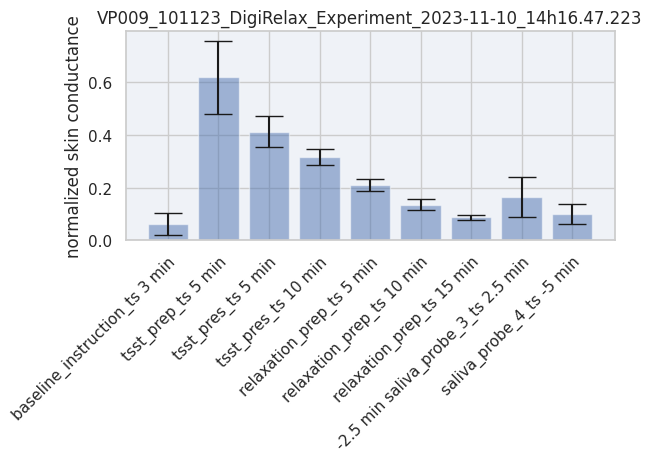

VP010_131123_DigiRelax_Experiment_2023-11-13_09h54.08.913
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


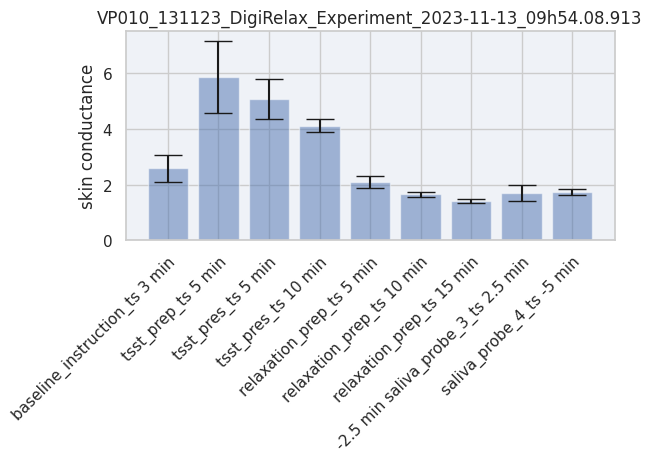

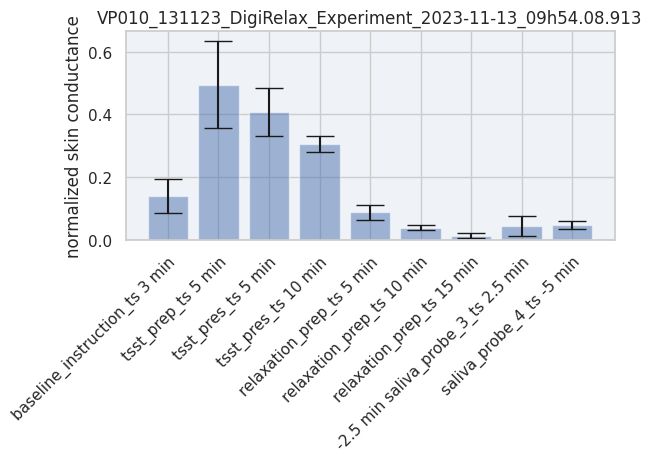

VP011_131123_DigiRelax_Experiment_2023-11-13_14h42.51.249
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


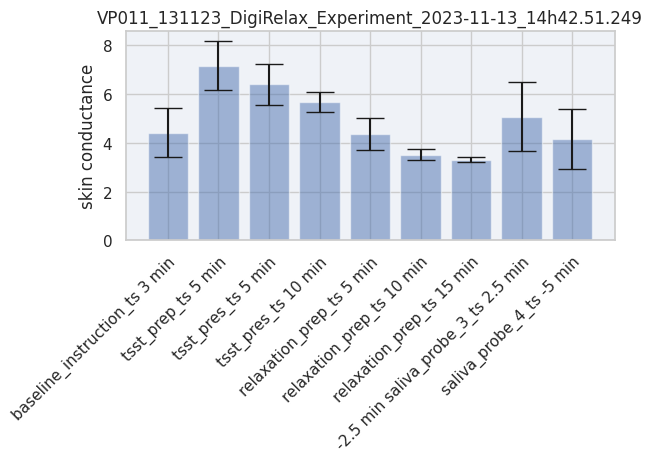

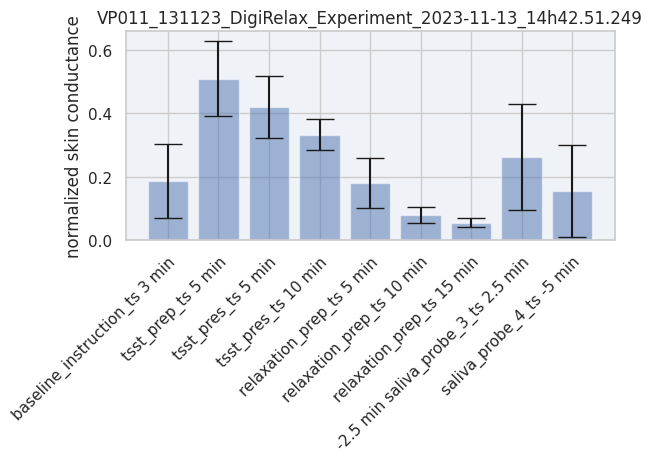

VP012_141123_DigiRelax_Experiment_2023-11-14_09h47.48.508
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


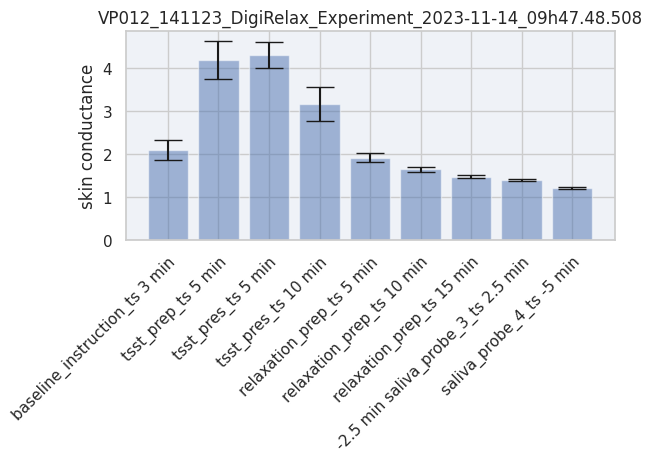

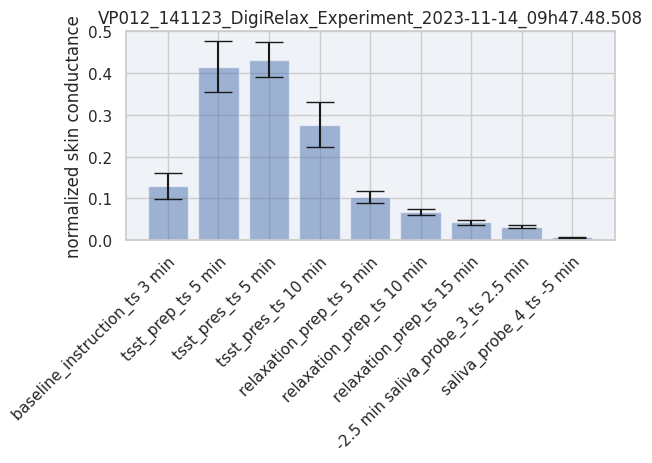

VP013_151123_DigiRelax_Experiment_2023-11-15_09h52.50.734
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


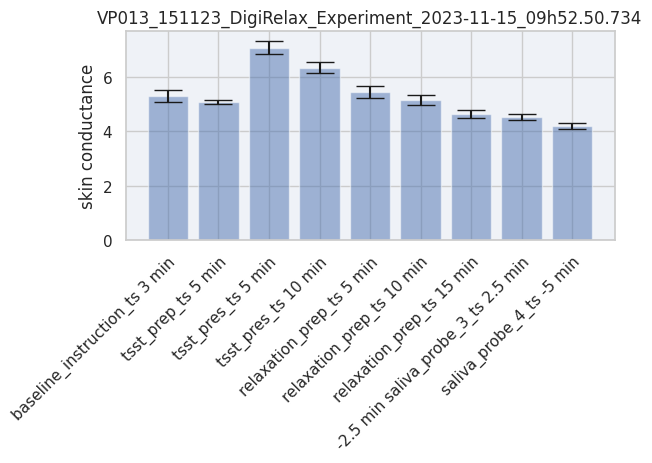

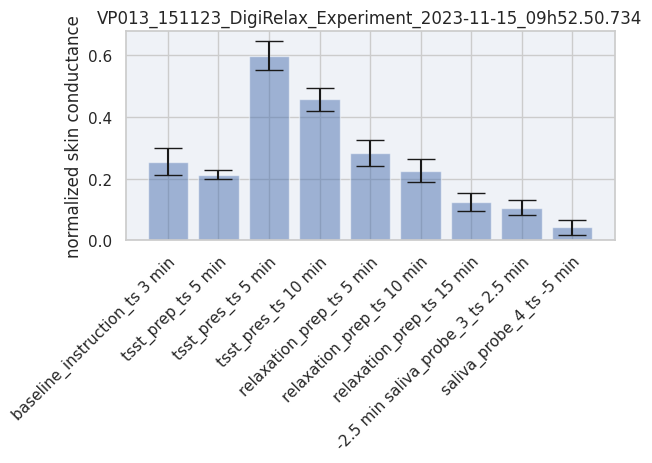

VP014_151123_DigiRelax_Experiment_2023-11-15_14h23.06.117
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


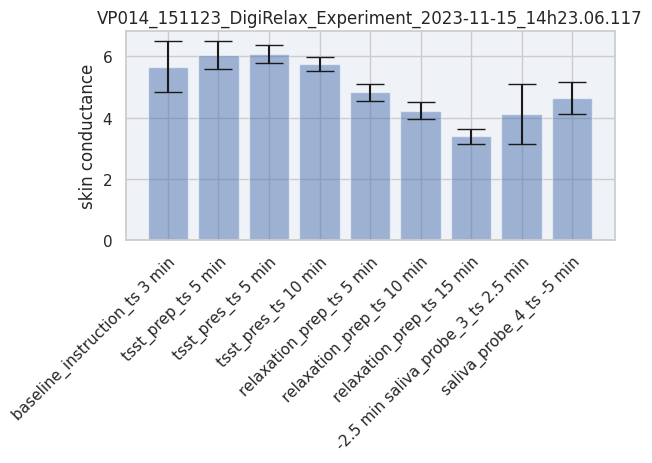

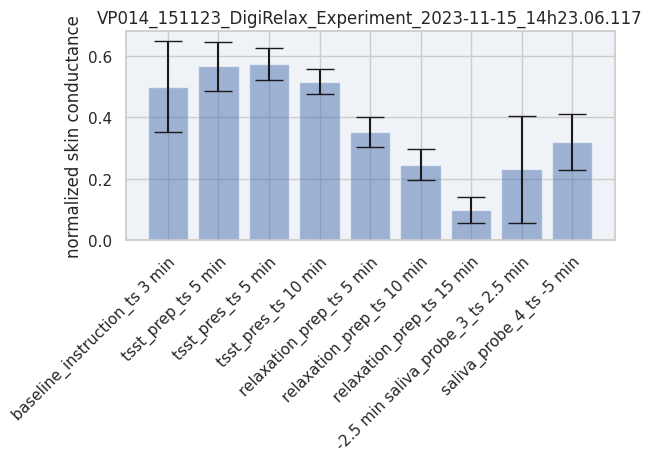

VP015_161123_DigiRelax_Experiment_2023-11-16_09h47.53.124
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


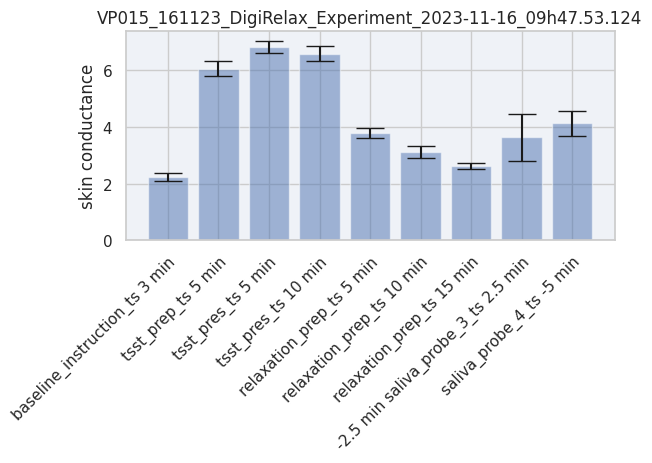

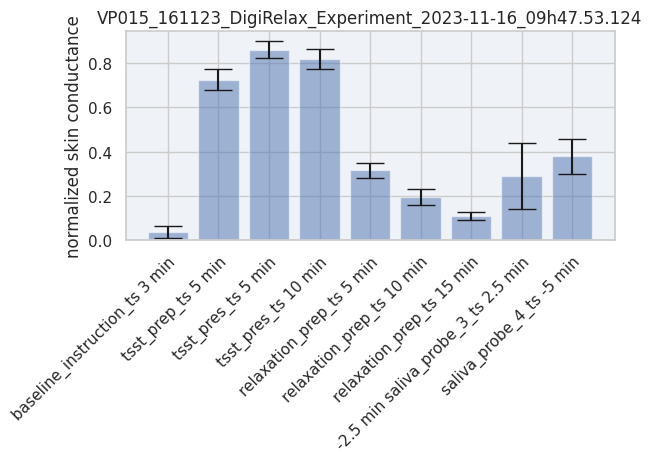

VP016_161123_DigiRelax_Experiment_2023-11-16_14h46.57.355
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


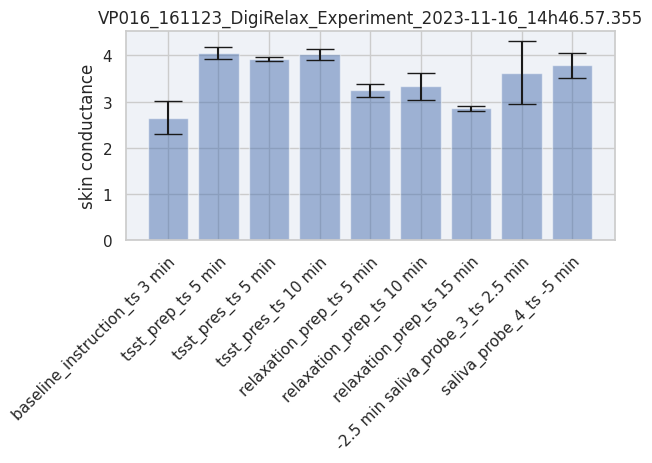

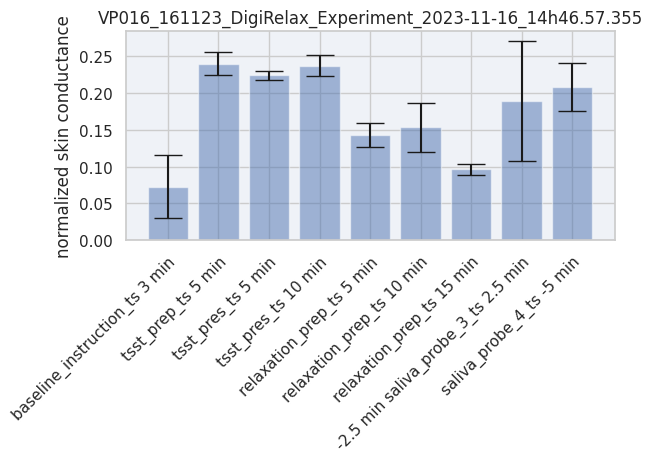

VP017_171123_DigiRelax_Experiment_2023-11-17_14h43.13.415
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


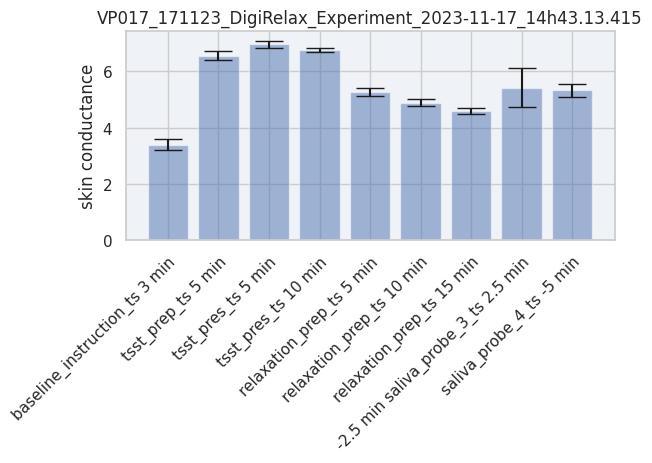

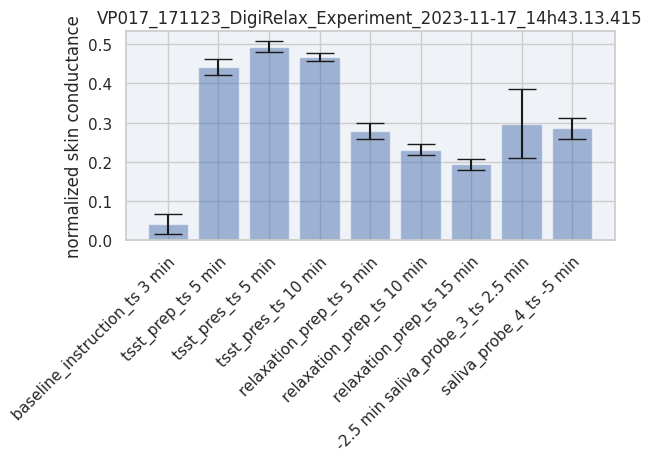

VP018_201123_DigiRelax_Experiment_2023-11-20_09h51.59.612
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


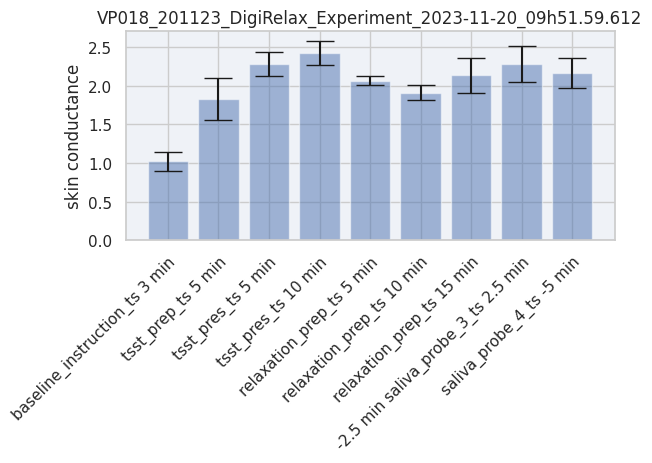

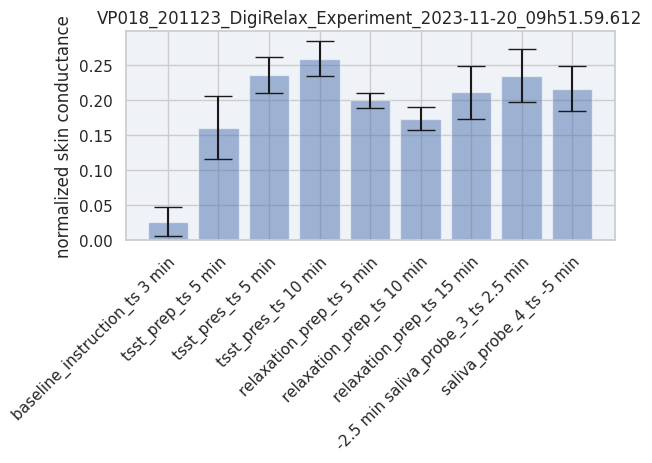

VP019_201123_DigiRelax_Experiment_2023-11-20_14h48.37.367
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


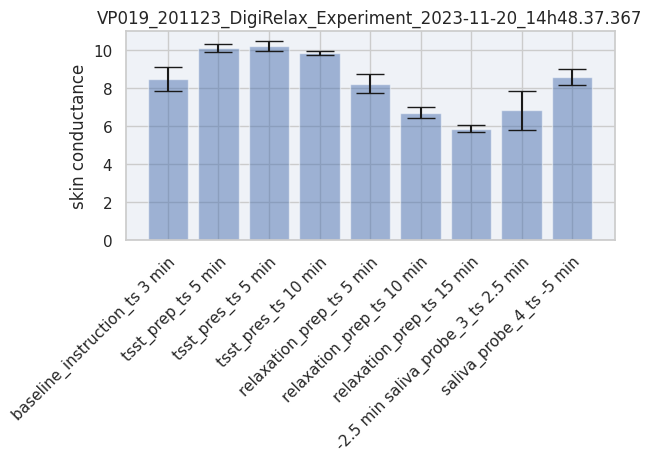

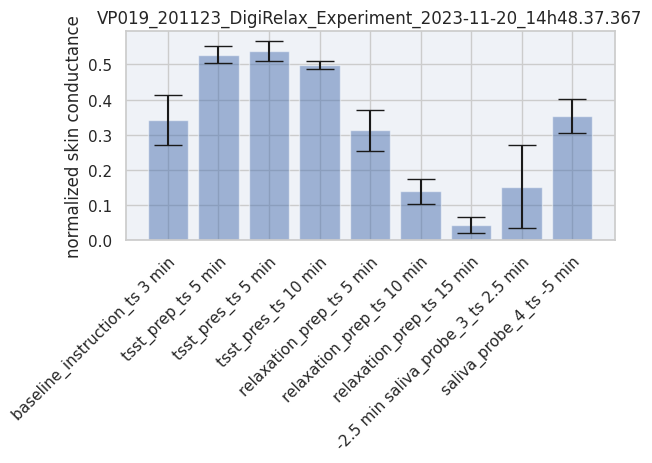

VP020_221123_DigiRelax_Experiment_2023-11-22_09h48.04.766
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


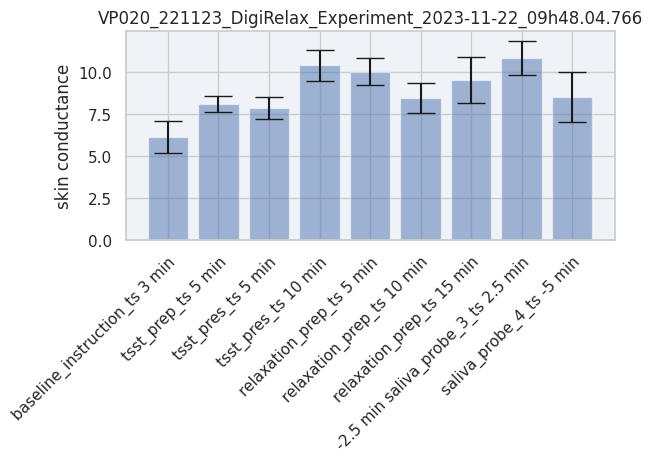

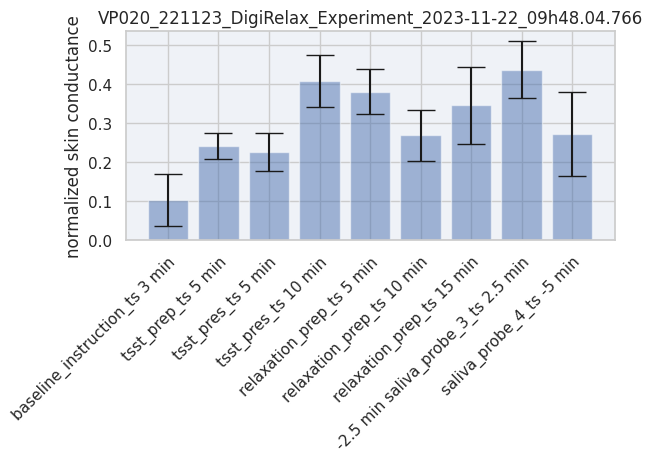

VP021_221123_DigiRelax_Experiment_2023-11-22_14h43.57.344
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


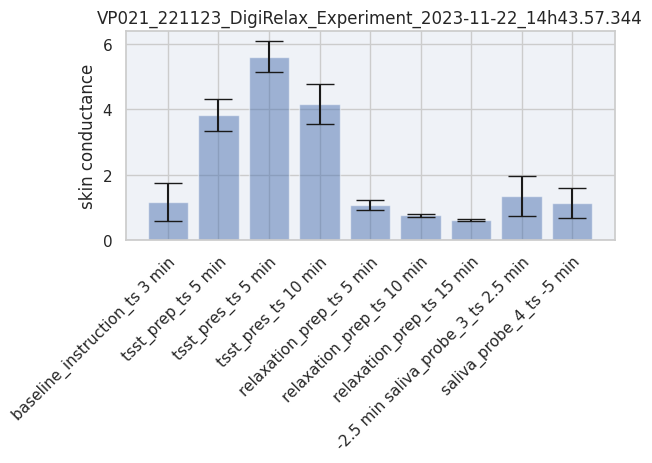

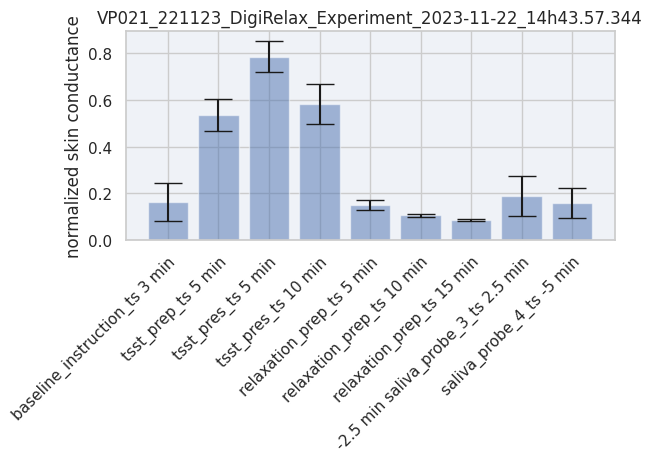

VP022_231123_DigiRelax_Experiment_2023-11-23_09h47.27.026
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


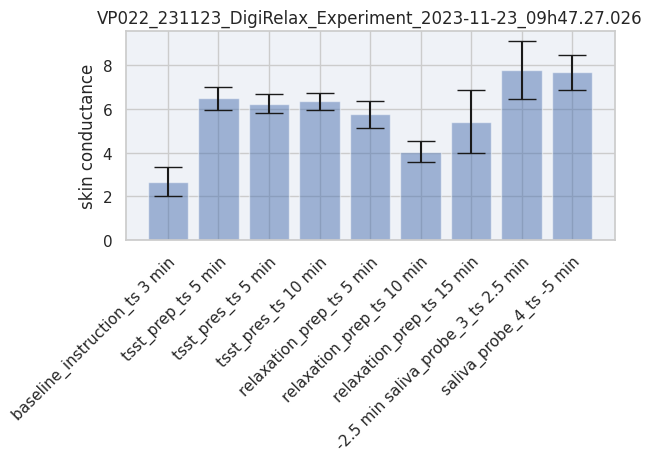

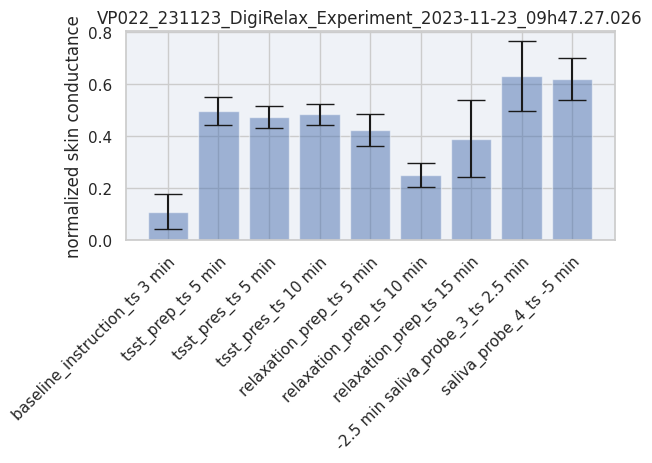

VP023_231123_DigiRelax_Experiment_2023-11-23_14h49.16.111
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


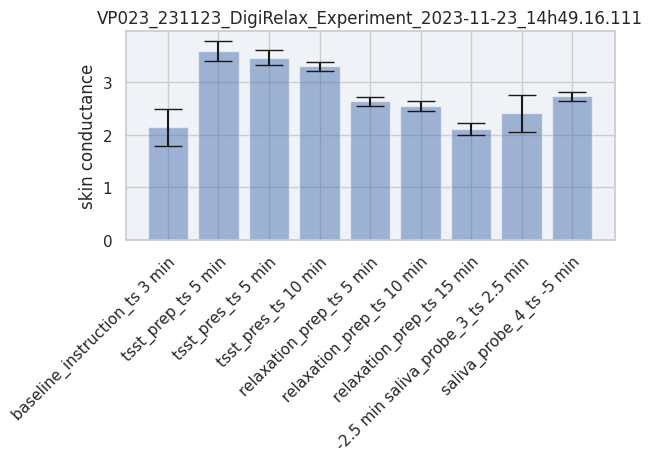

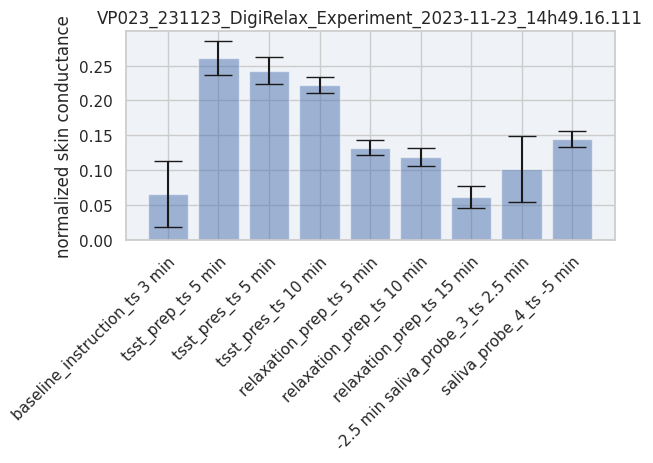

VP024_241123_DigiRelax_Experiment_2023-11-24_15h57.15.078
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


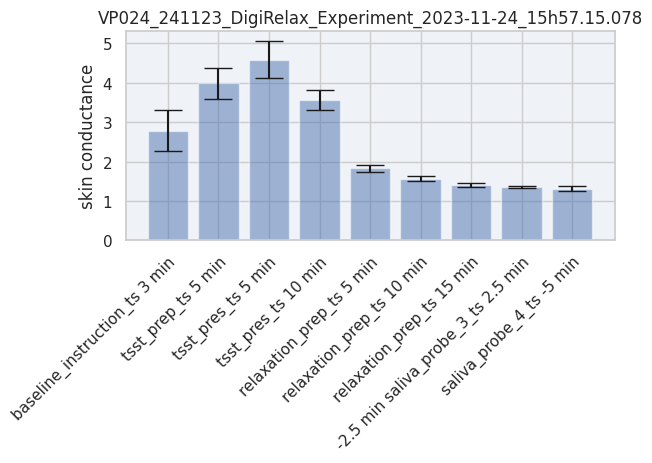

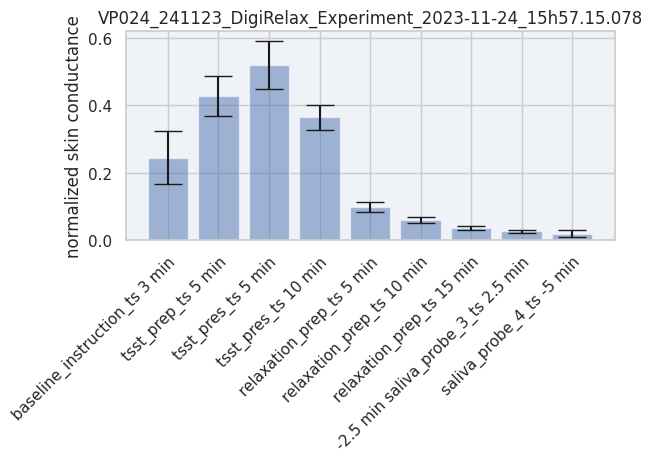

VP025_271123_DigiRelax_Experiment_2023-11-27_09h46.03.287
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


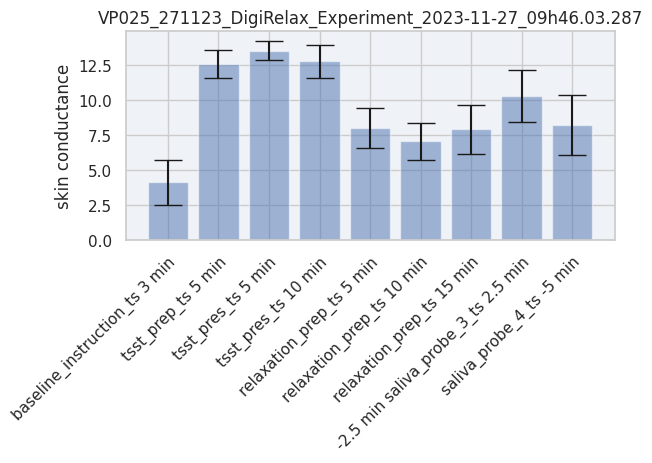

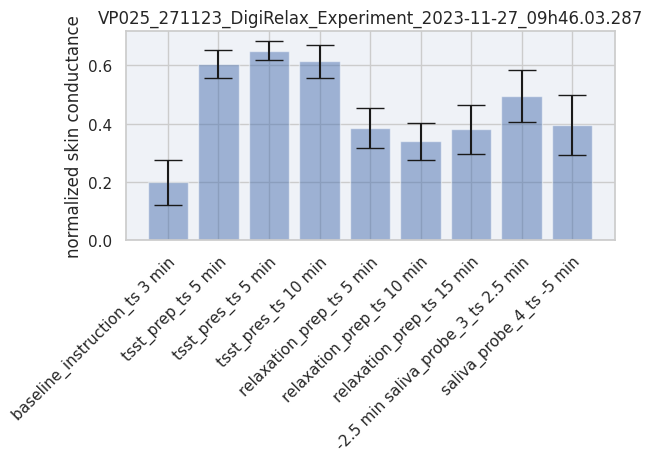

VP26_271123_DigiRelax_Experiment_2023-11-27_13h16.52.357
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


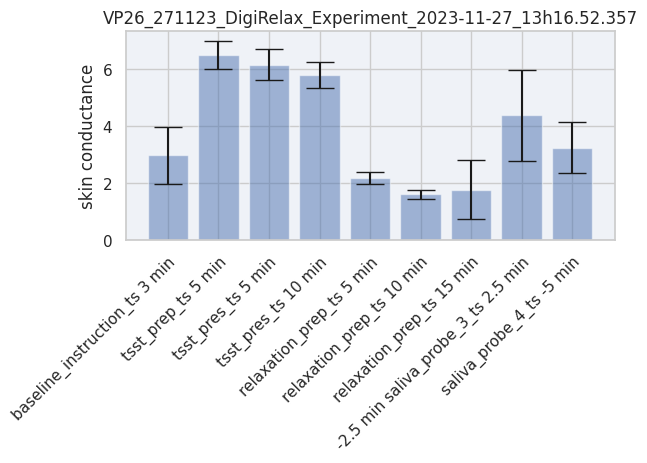

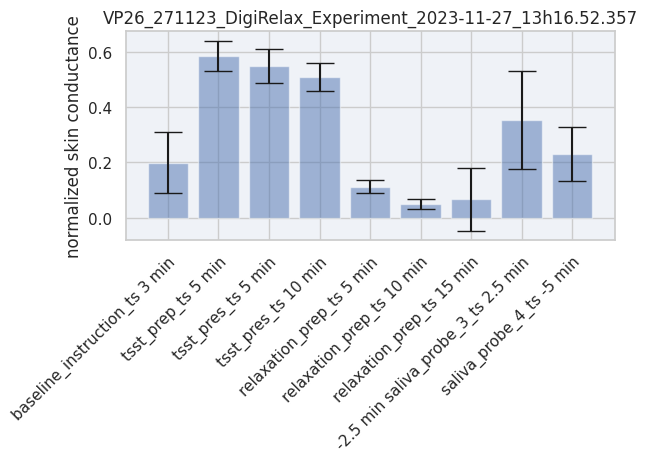

VP027_271123_DigiRelax_Experiment_2023-11-27_15h58.18.227
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


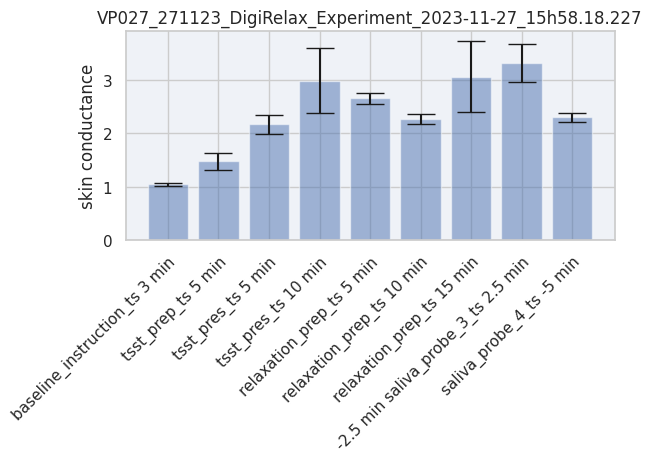

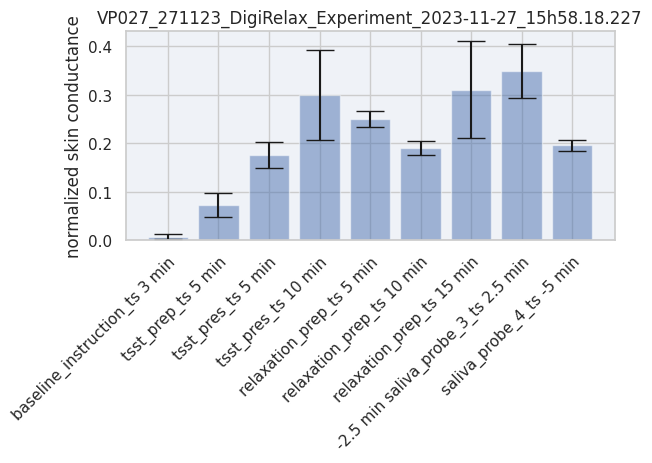

VP028_281123_DigiRelax_Experiment_2023-11-28_13h11.36.660
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


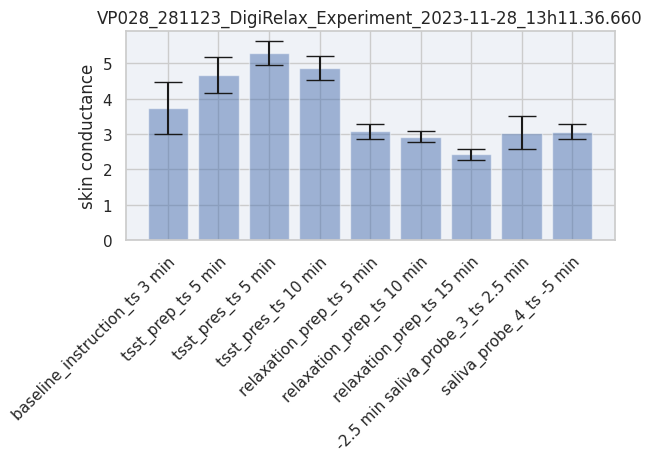

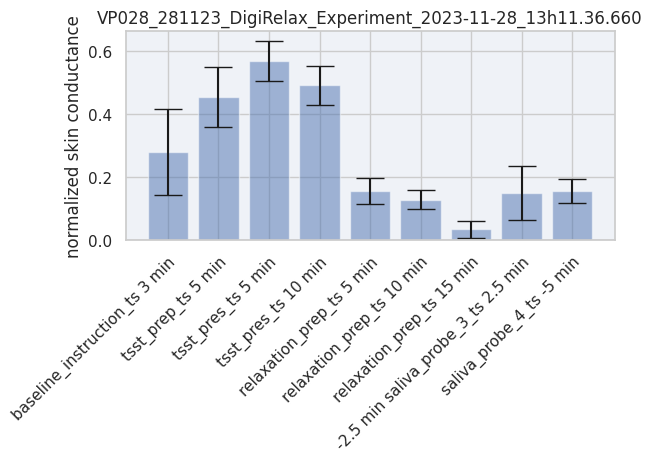

VP029_281123_DigiRelax_Experiment_2023-11-28_15h49.00.382
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


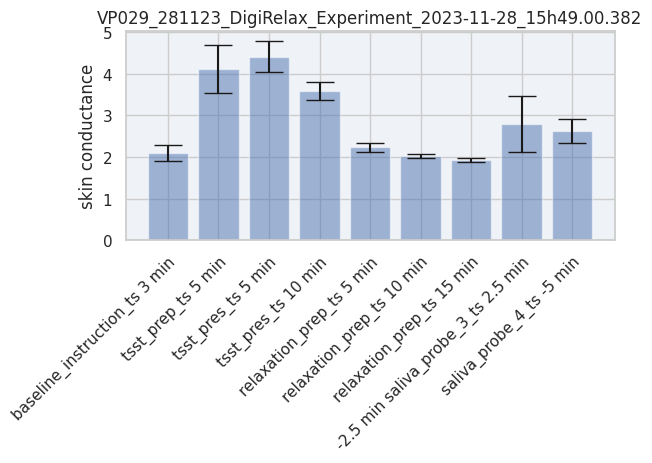

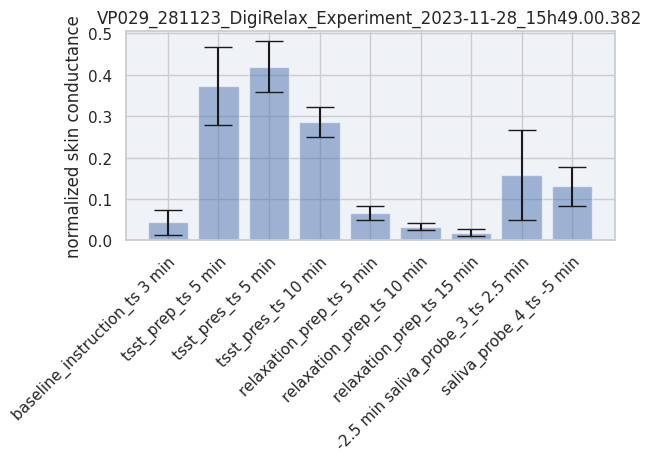

VP030_291123_DigiRelax_Experiment_2023-11-29_09h54.53.886
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


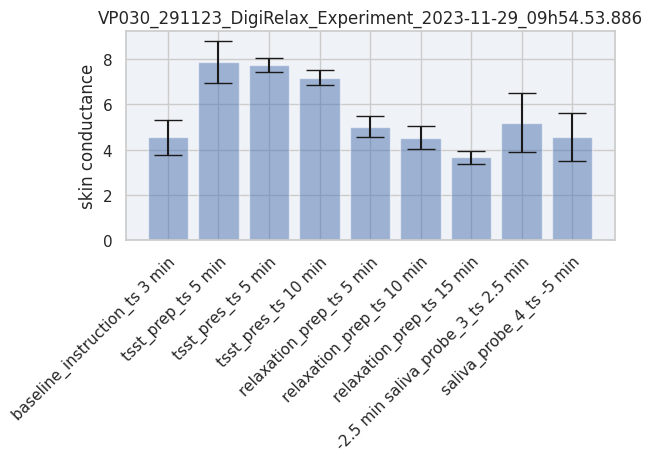

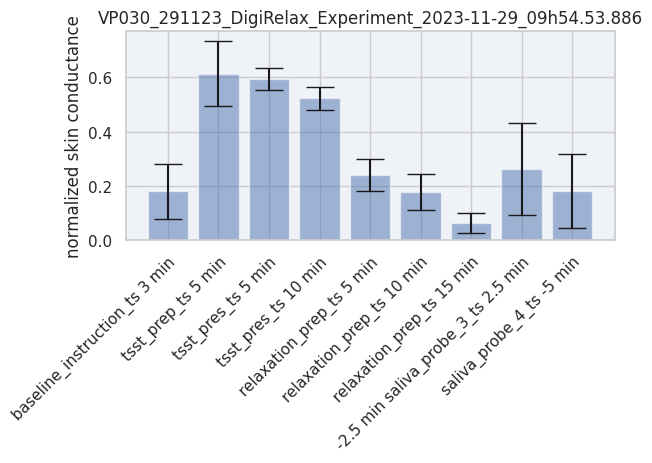

VP031_291123_DigiRelax_Experiment_2023-11-29_14h41.15.470
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


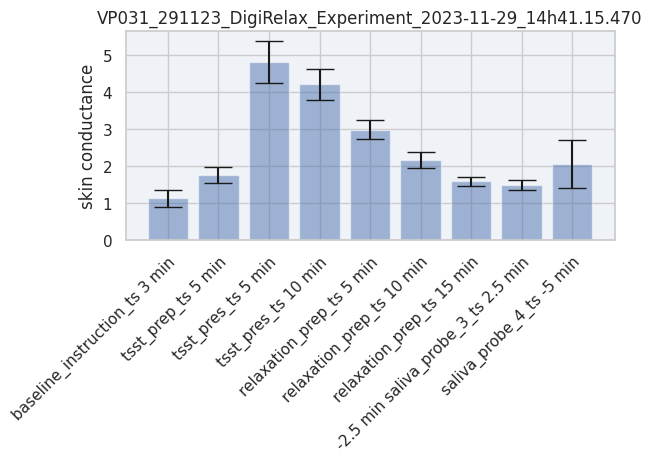

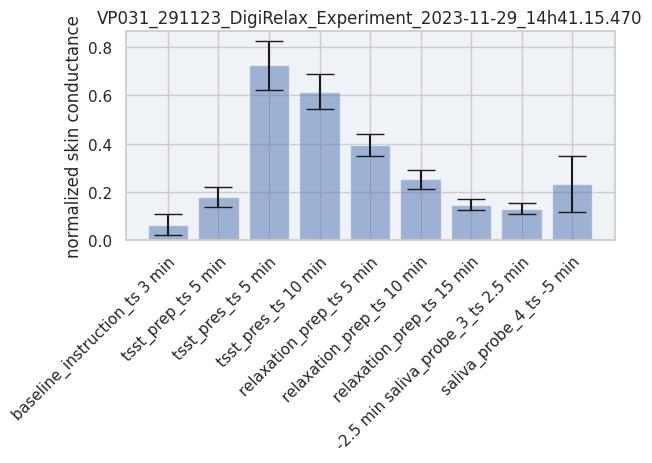

VP032_301123_DigiRelax_Experiment_2023-11-30_09h49.51.787
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


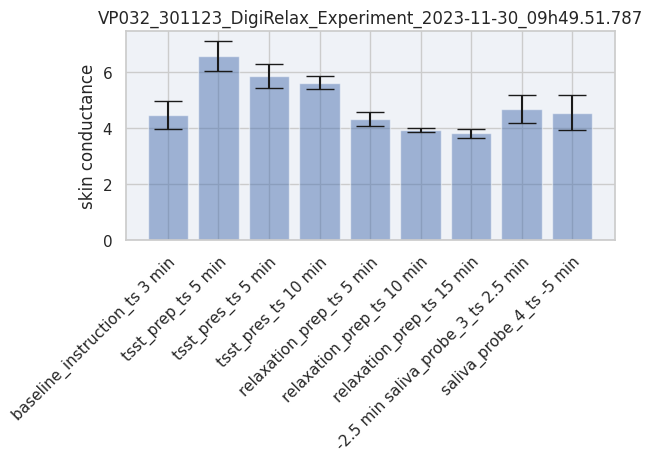

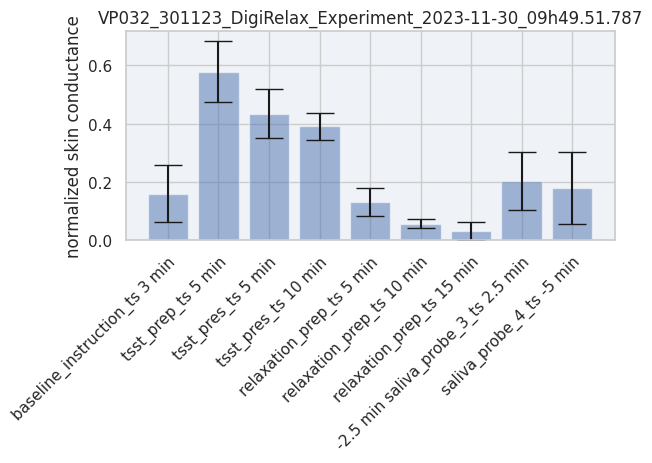

VP033_301123_DigiRelax_Experiment_2023-11-30_15h44.58.284
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


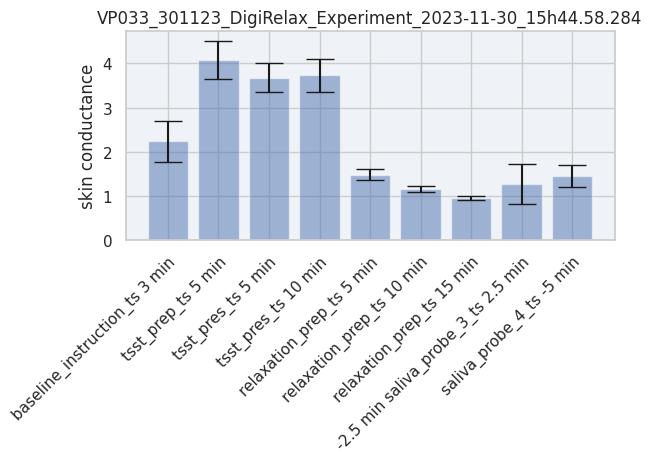

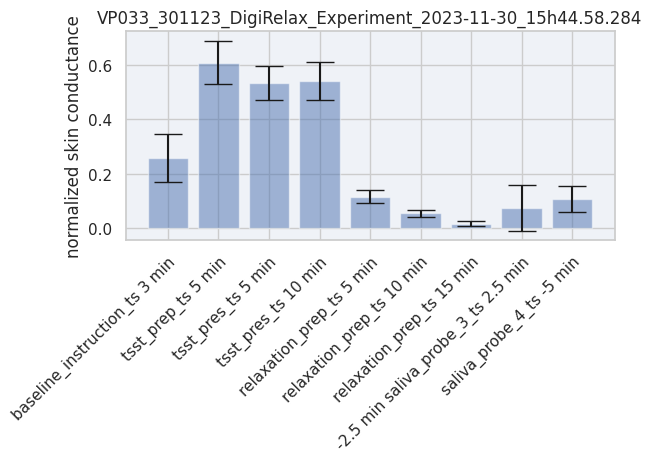

VP034_011223_DigiRelax_Experiment_2023-12-01_14h41.10.723
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


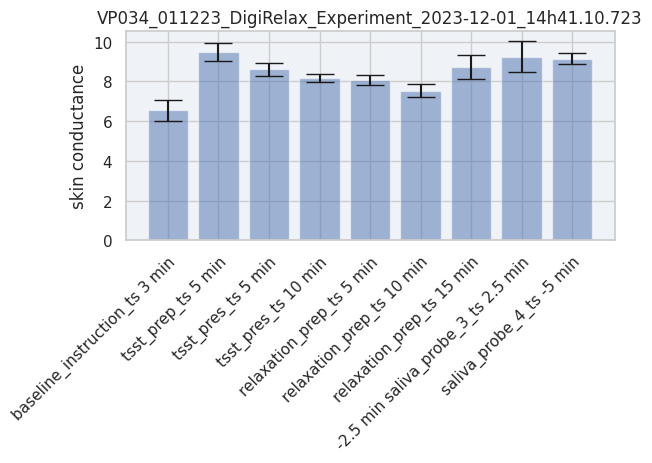

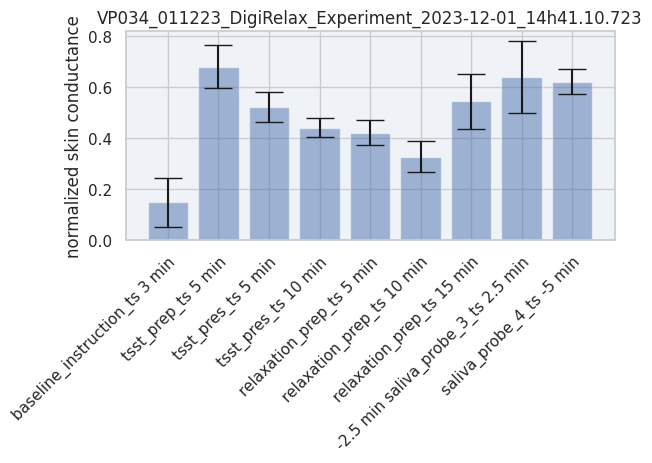

VP035_041123_DigiRelax_Experiment_2023-12-04_09h54.08.642
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


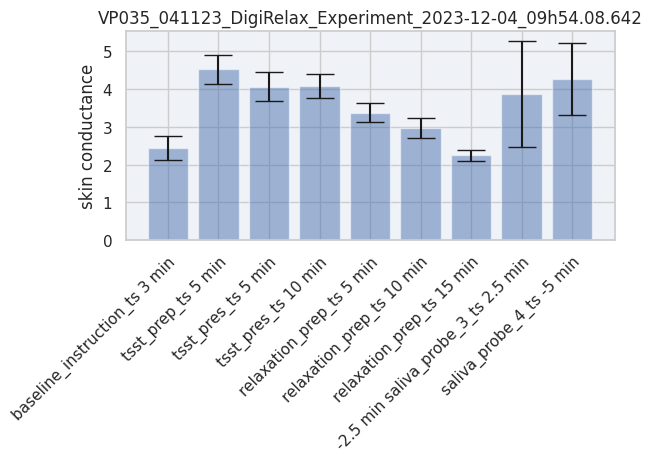

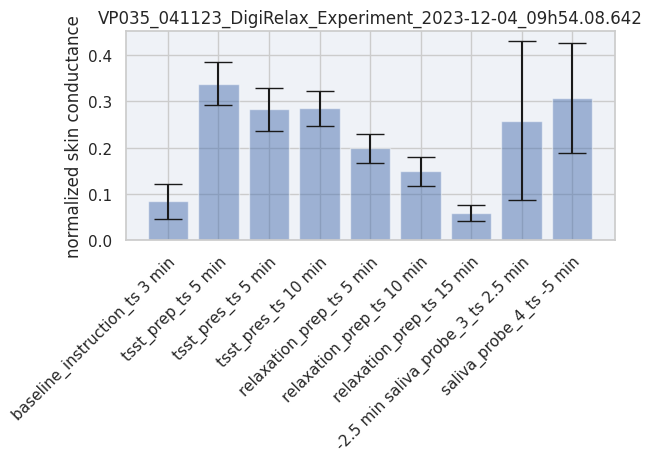

VP037_051223_DigiRelax_Experiment_2023-12-05_10h01.53.815
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


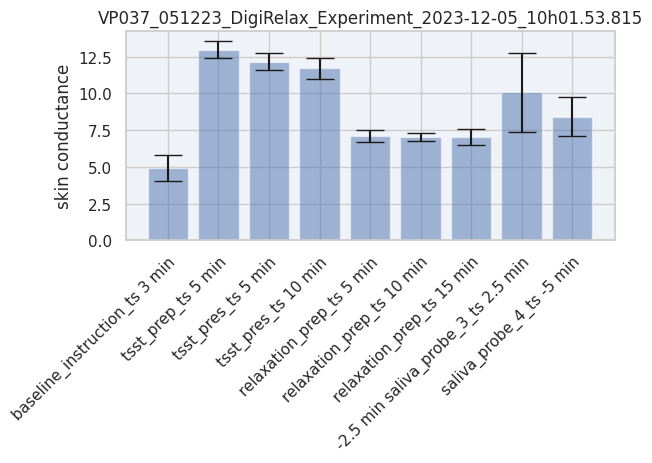

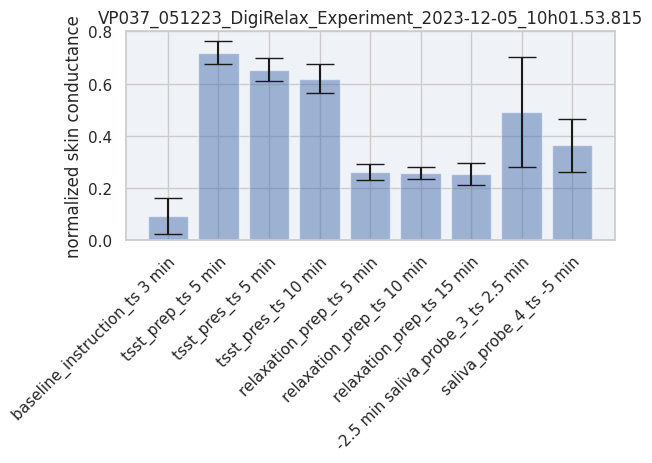

VP038_051223_DigiRelax_Experiment_2023-12-05_15h52.43.156
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


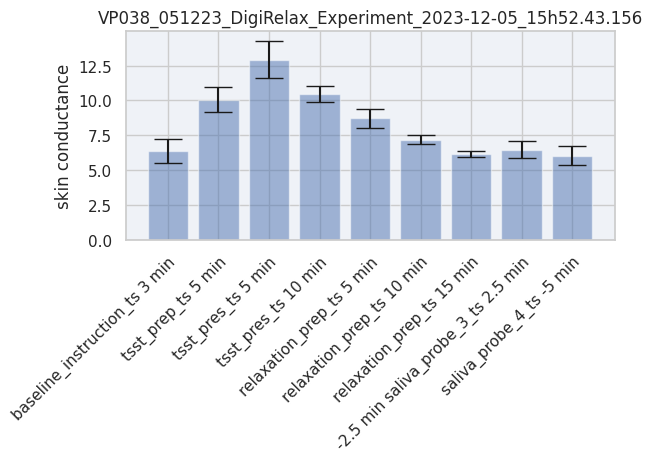

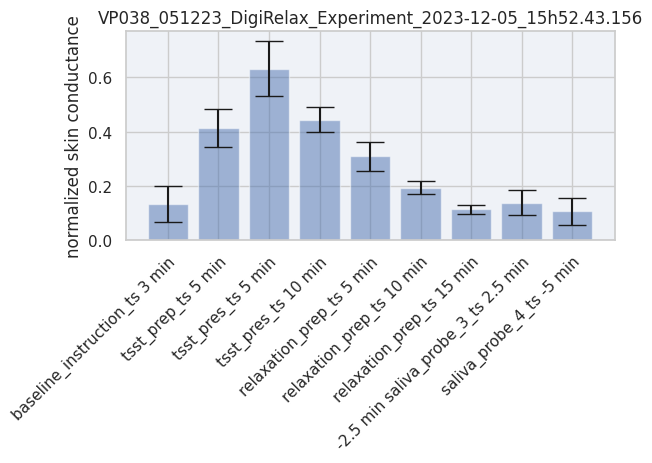

VP039_061223_DigiRelax_Experiment_2023-12-06_09h56.18.635
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


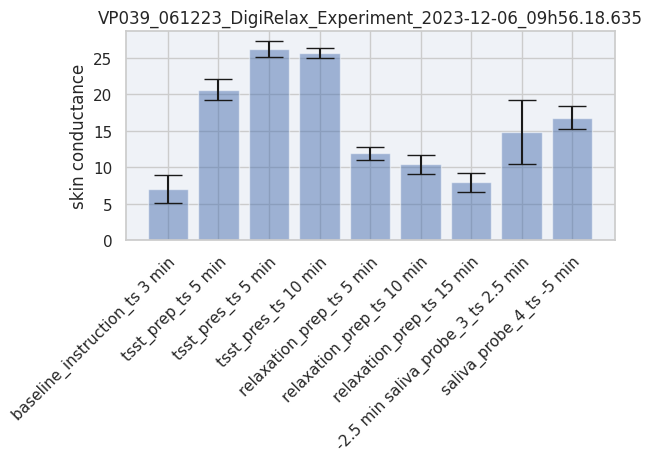

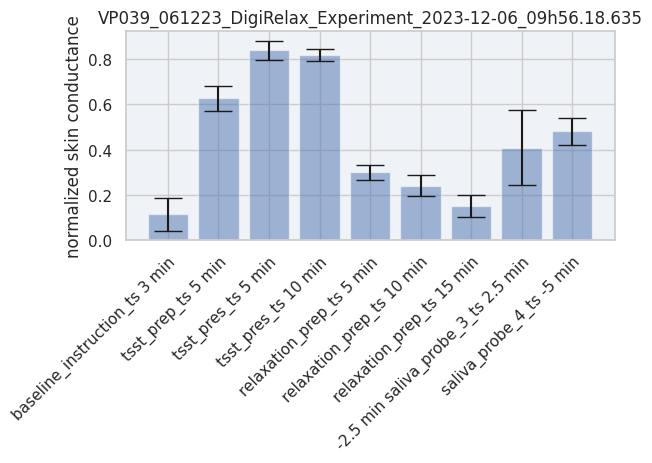

VP040_061223_DigiRelax_Experiment_2023-12-06_13h18.31.319
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


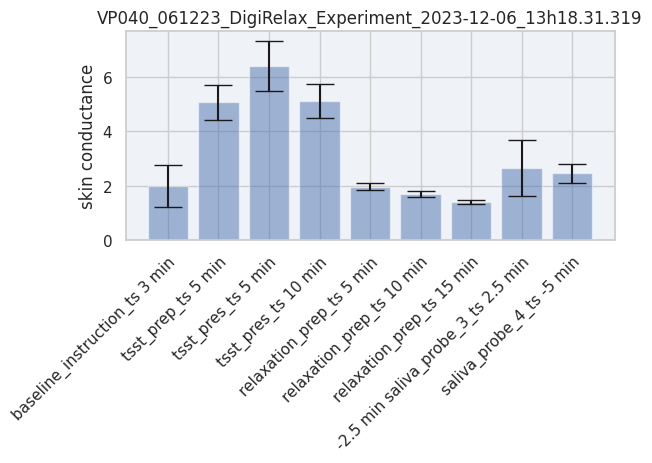

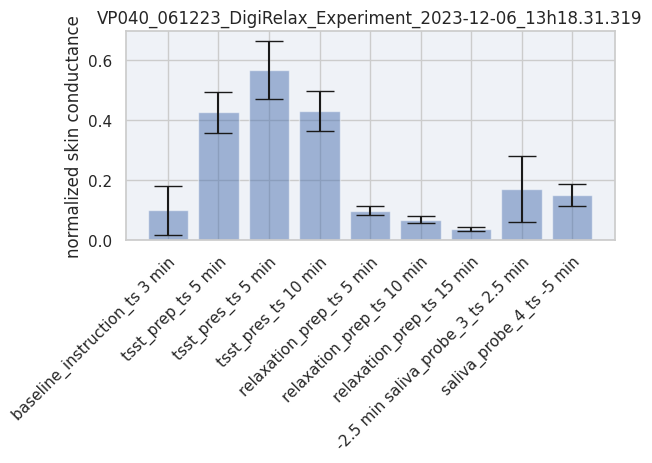

VP041_061223_DigiRelax_Experiment_2023-12-06_15h50.23.237
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


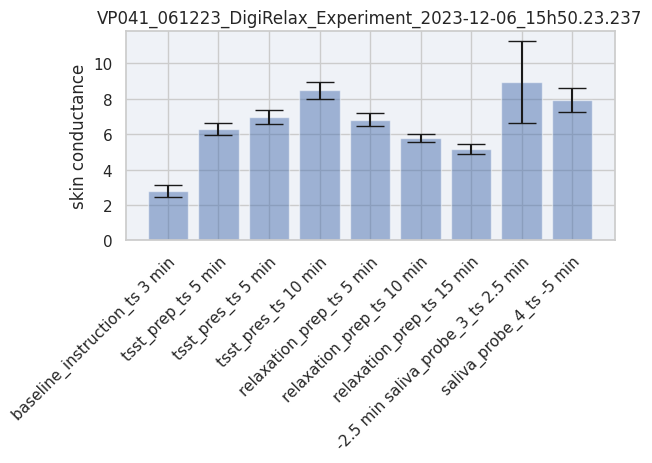

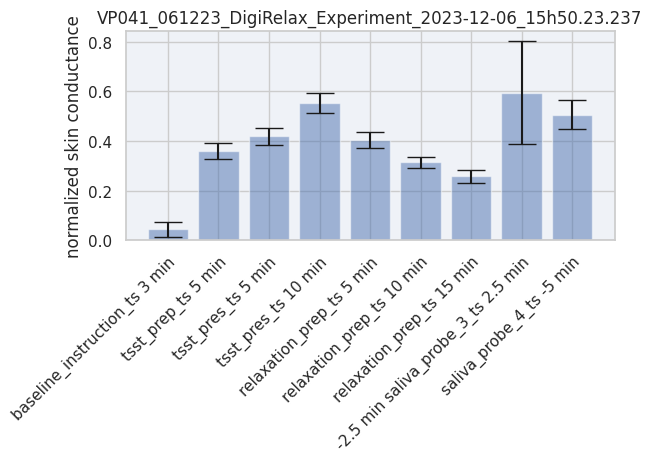

VP042_071223_DigiRelax_Experiment_2023-12-07_10h46.20.248
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


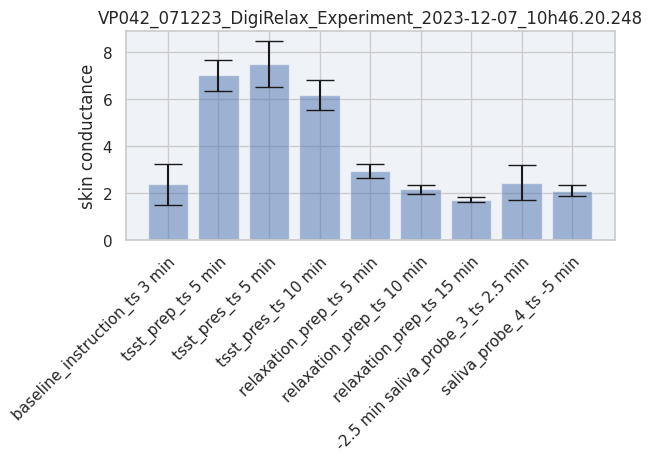

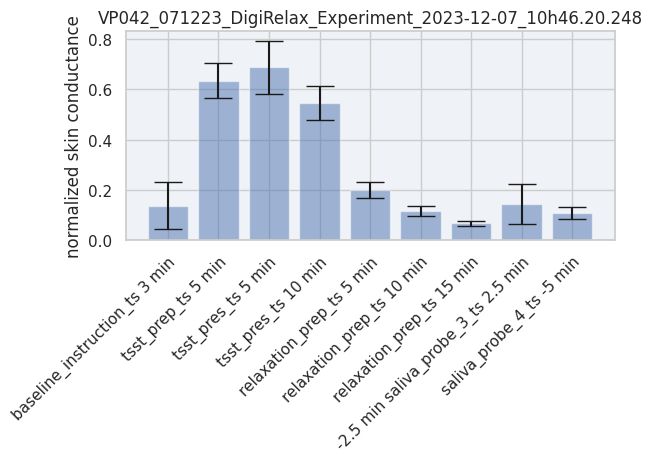

VP043_071223_DigiRelax_Experiment_2023-12-07_13h24.11.749
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


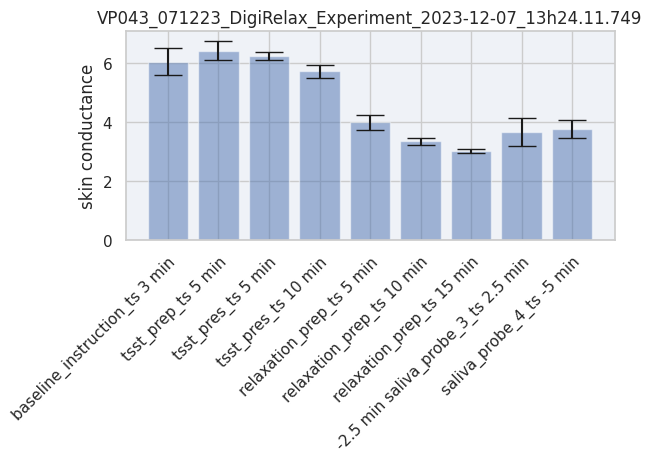

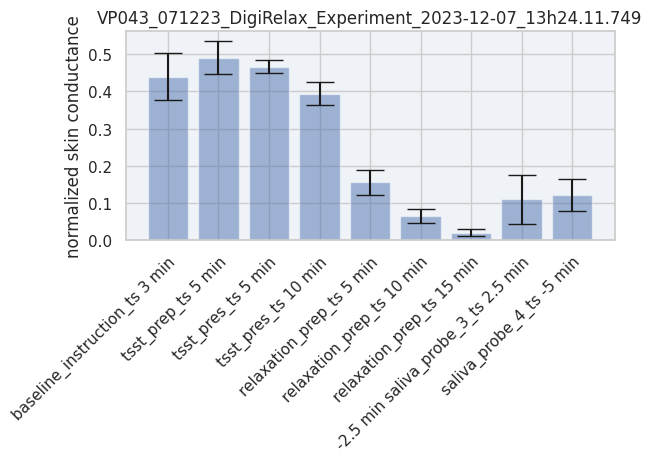

VP044_071223_DigiRelax_Experiment_2023-12-07_15h47.55.663
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


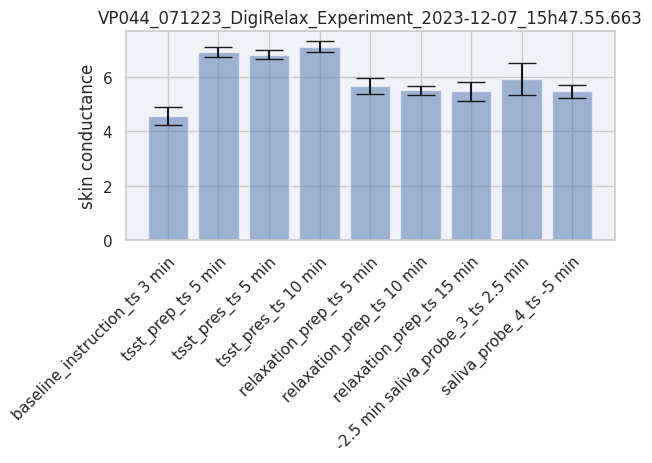

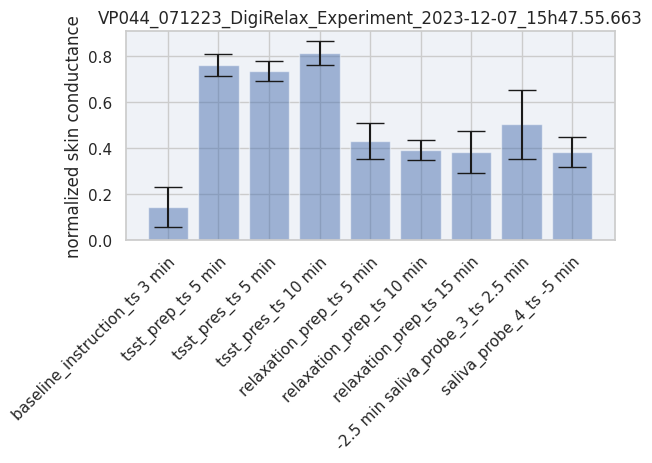

VP045_081223_DigiRelax_Experiment_2023-12-08_09h50.13.039
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


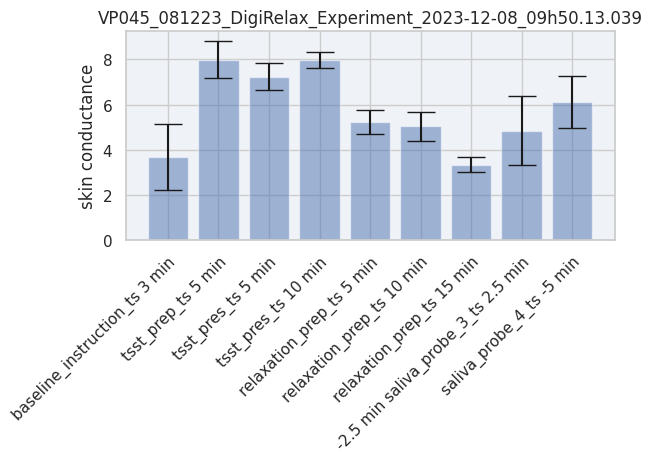

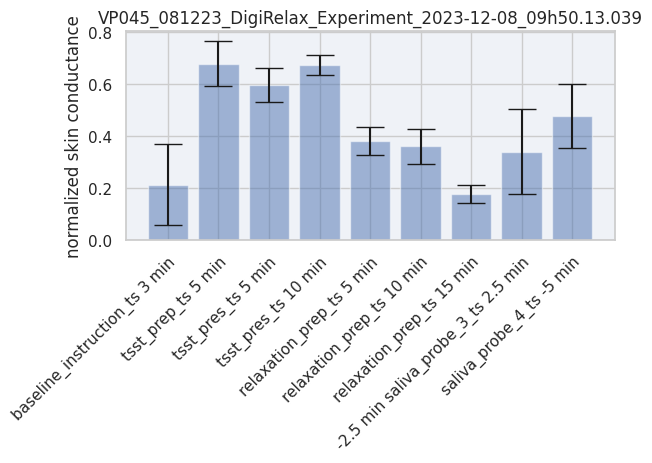

Vp046_081223_DigiRelax_Experiment_2023-12-08_14h49.59.665
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


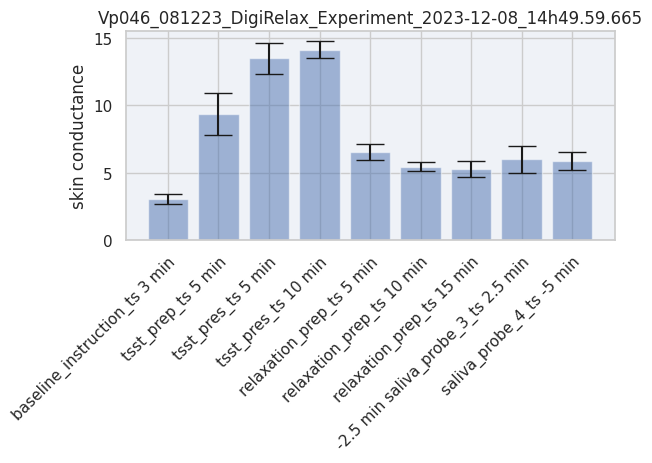

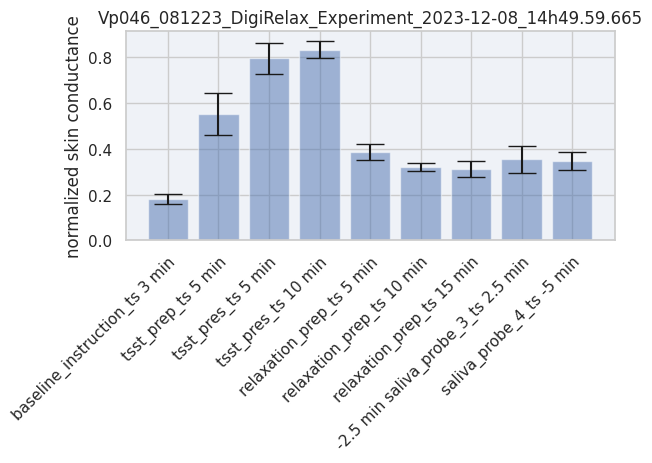

VP047_111223_DigiRelax_Experiment_2023-12-11_14h40.20.997
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


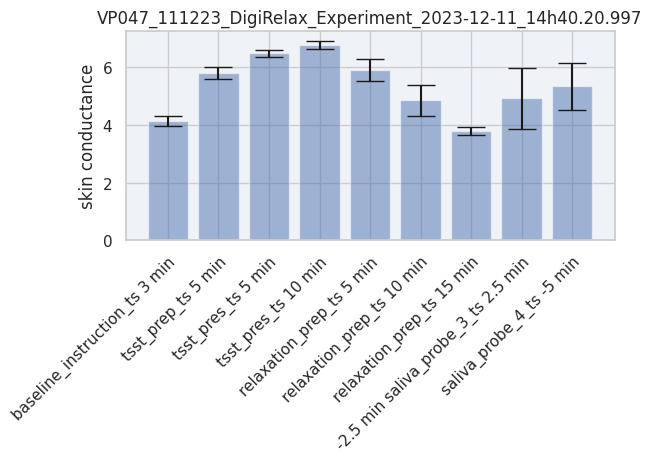

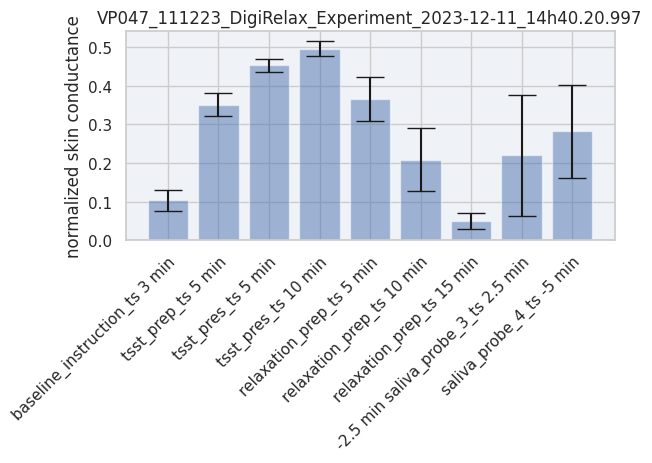

VP048_121223_DigiRelax_Experiment_2023-12-12_09h46.06.539
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


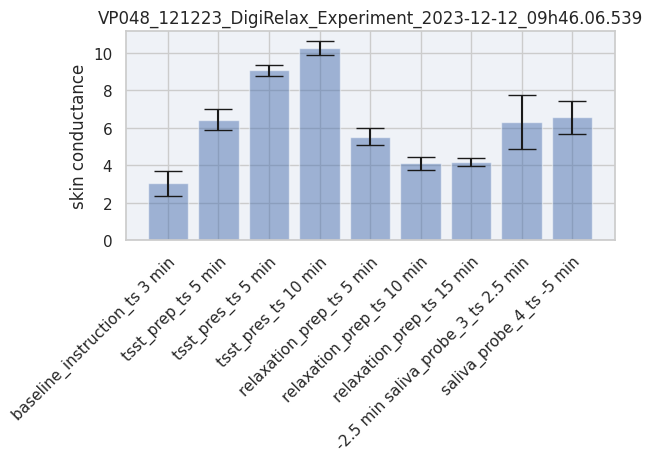

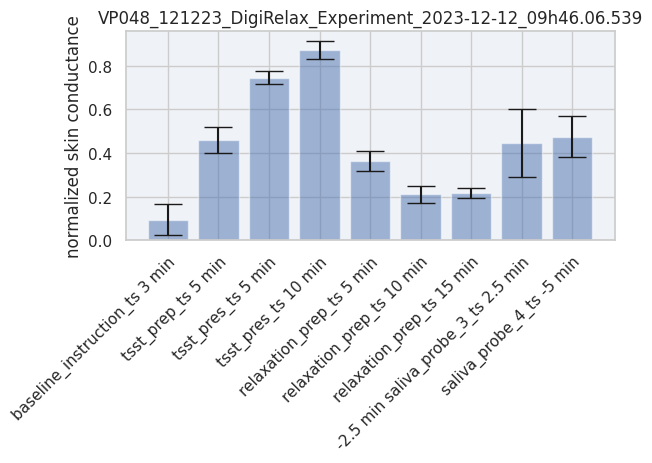

VP049_121223_DigiRelax_Experiment_2023-12-12_13h41.48.891
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


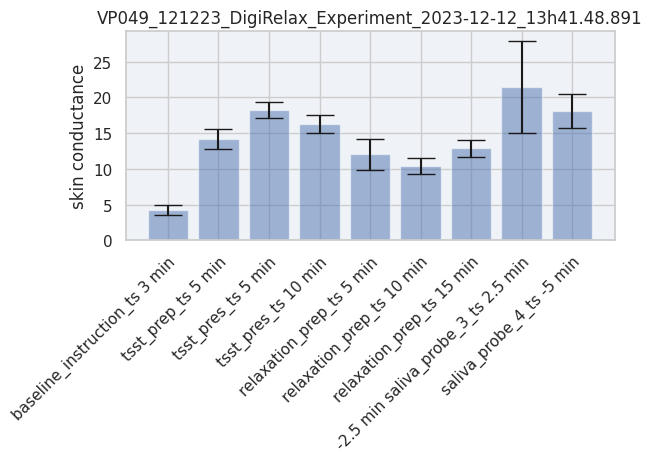

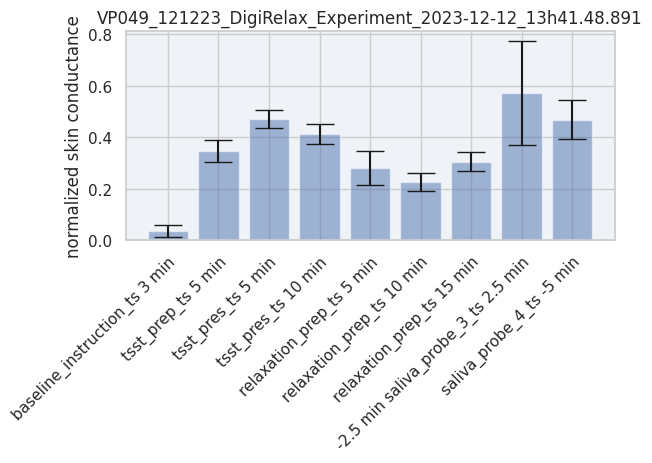

VP050_131223_DigiRelax_Experiment_2023-12-13_09h49.36.277
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


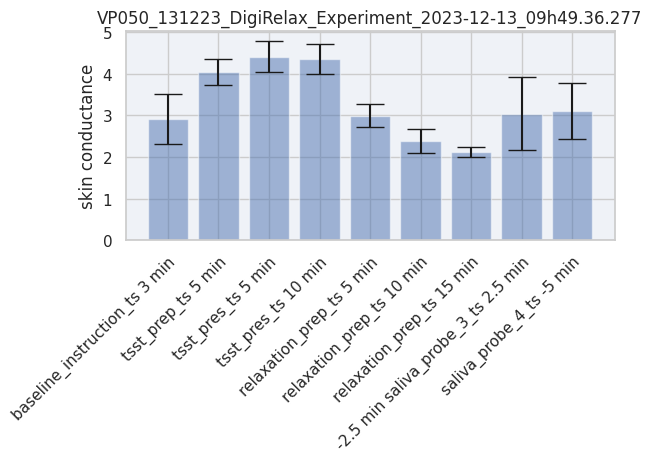

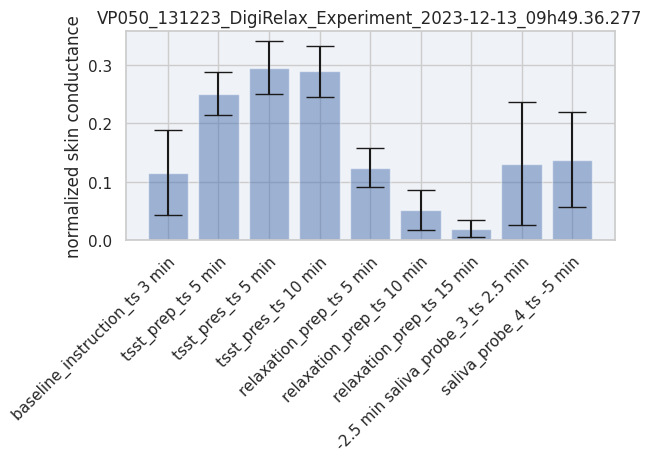

VP051_131223_DigiRelax_Experiment_2023-12-13_13h12.46.570
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


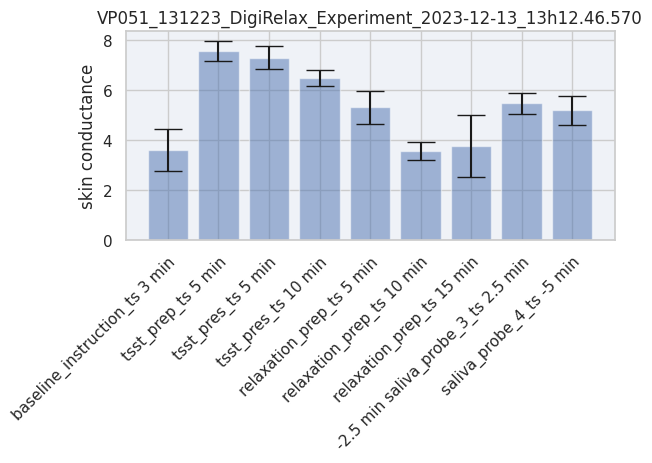

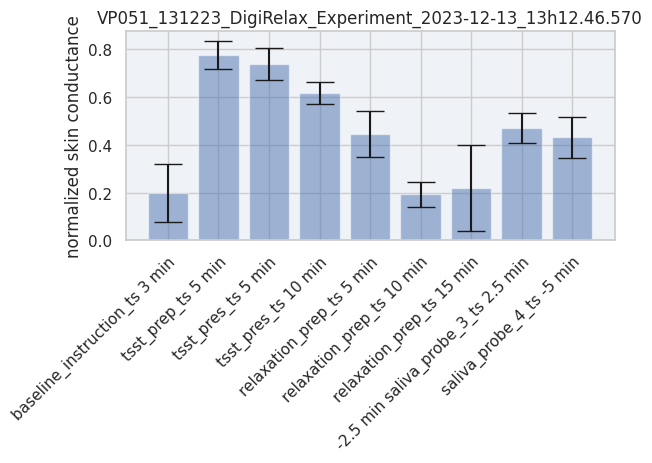

VP052_131223_DigiRelax_Experiment_2023-12-13_15h40.02.531
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


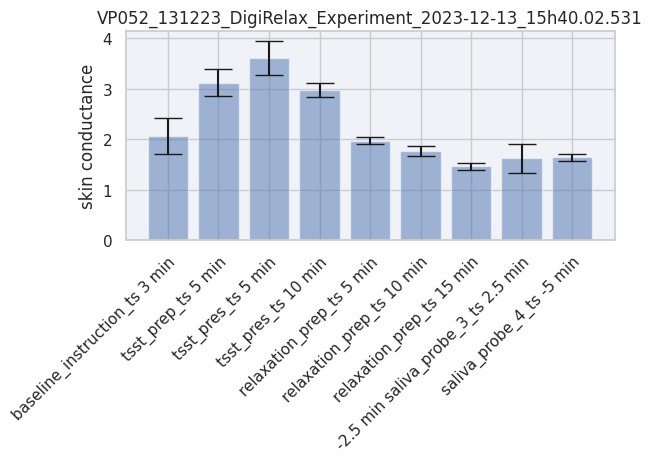

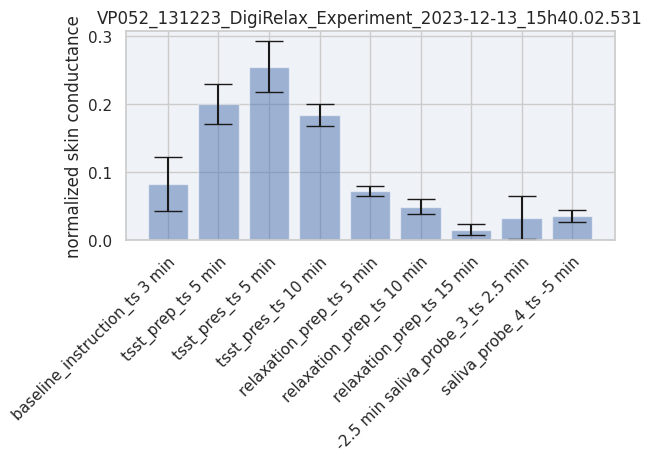

VP053_141223_DigiRelax_Experiment_2023-12-14_09h43.01.217
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


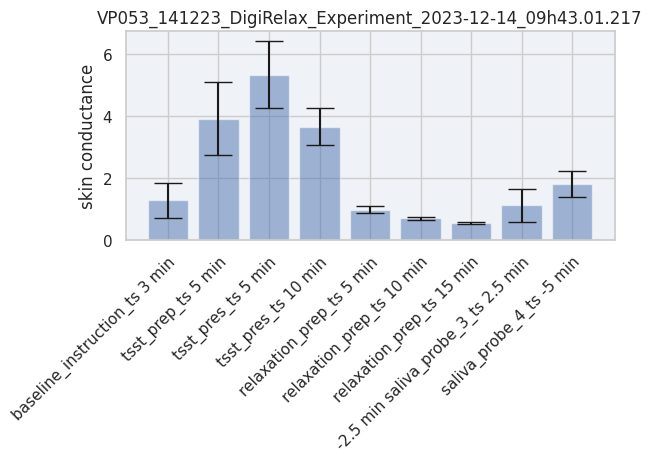

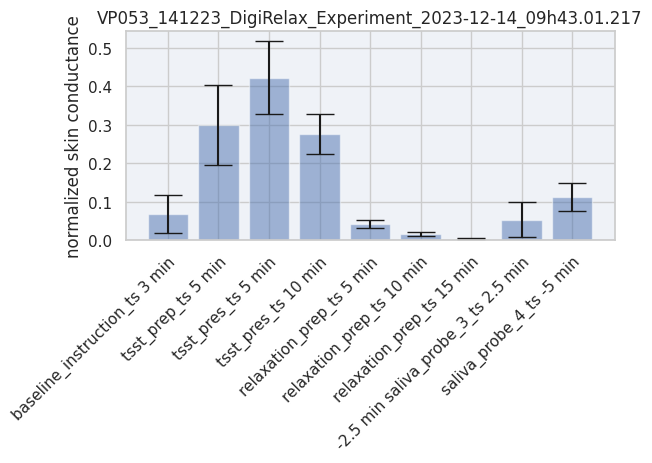

VP054_141223_DigiRelax_Experiment_2023-12-14_13h16.33.883
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


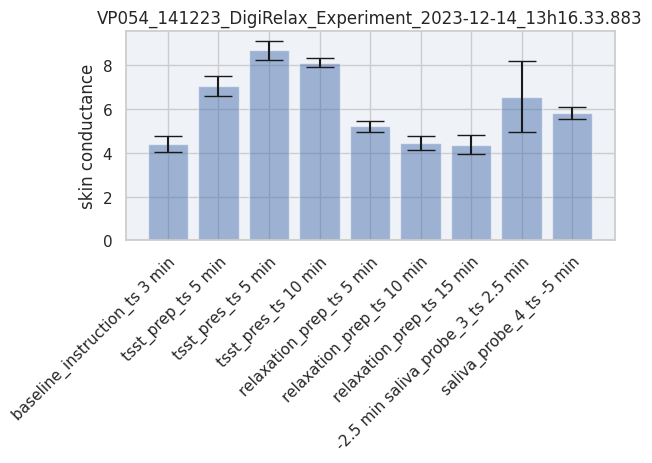

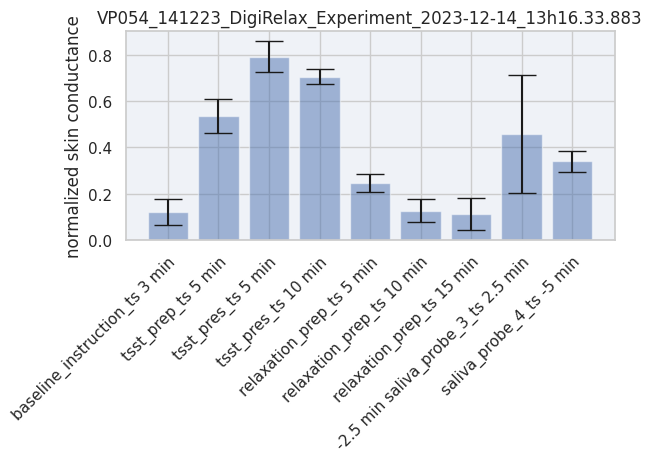

VP055_141223_DigiRelax_Experiment_2023-12-14_15h45.35.483
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


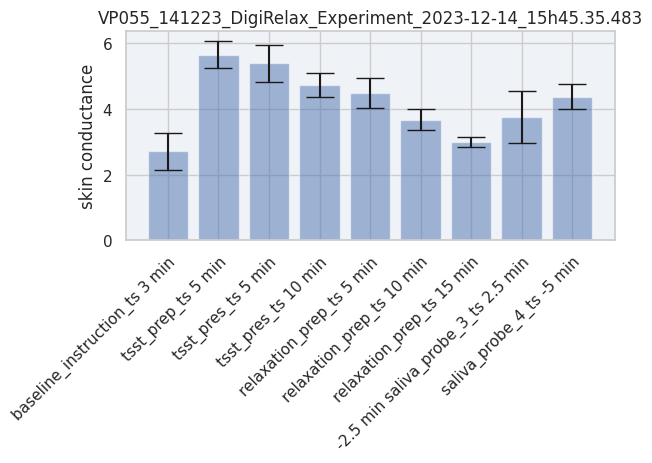

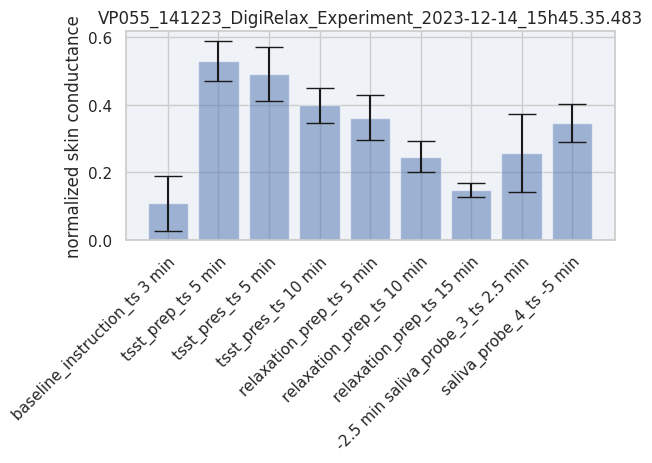

VP056_151223_DigiRelax_Experiment_2023-12-15_09h45.05.317
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


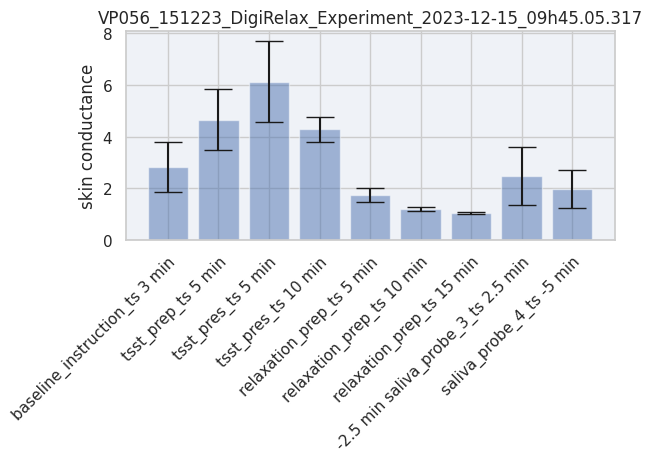

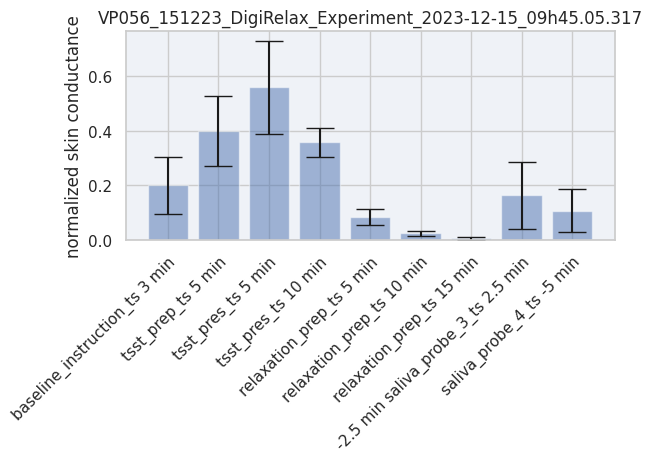

VP057_151223_DigiRelax_Experiment_2023-12-15_15h00.46.722
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


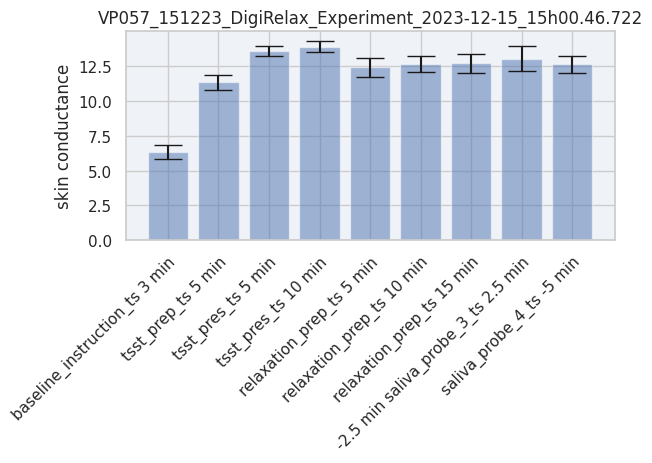

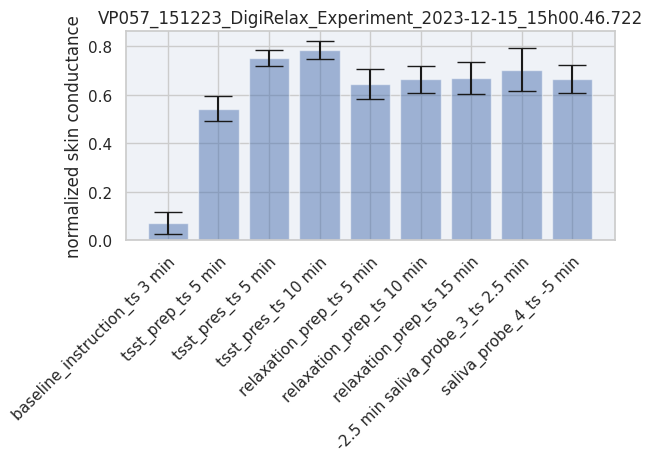

VP059_181223_DigiRelax_Experiment_2023-12-18_14h46.34.198
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


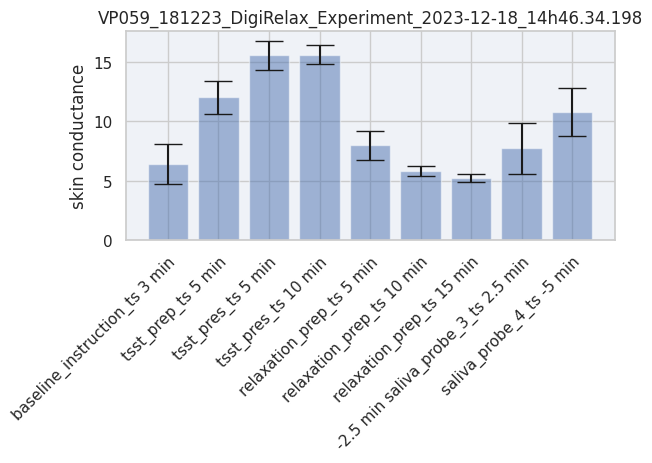

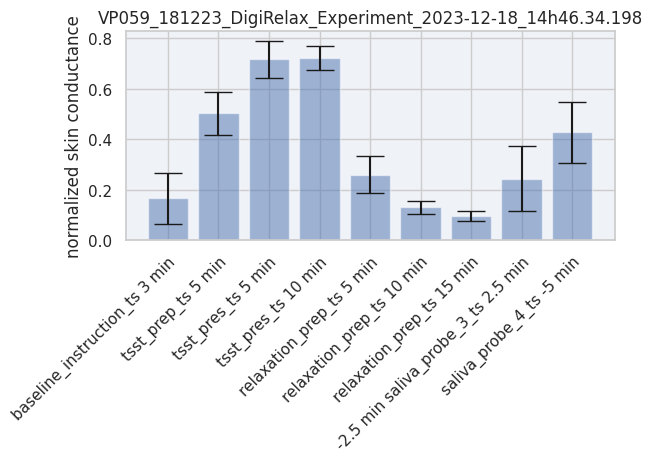

VP060_191223_DigiRelax_Experiment_2023-12-19_09h48.26.679
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


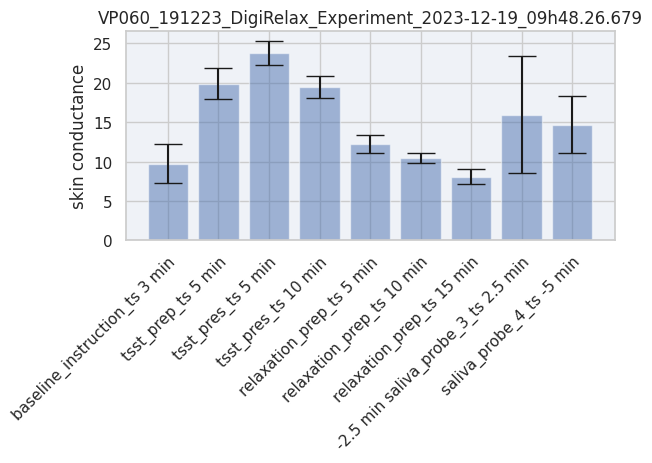

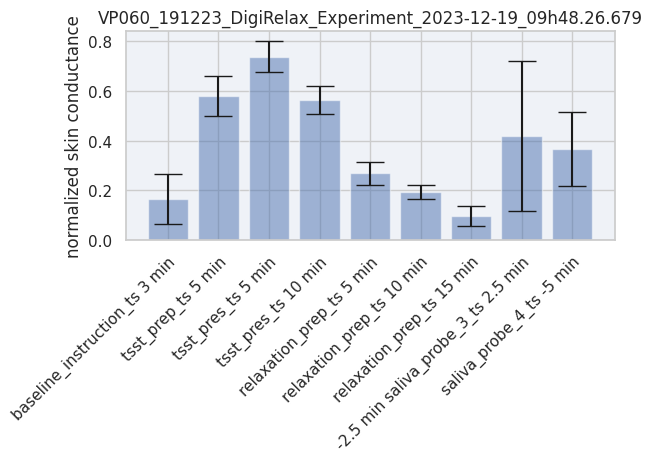

VP061_191223_DigiRelax_Experiment_2023-12-19_15h10.55.419
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


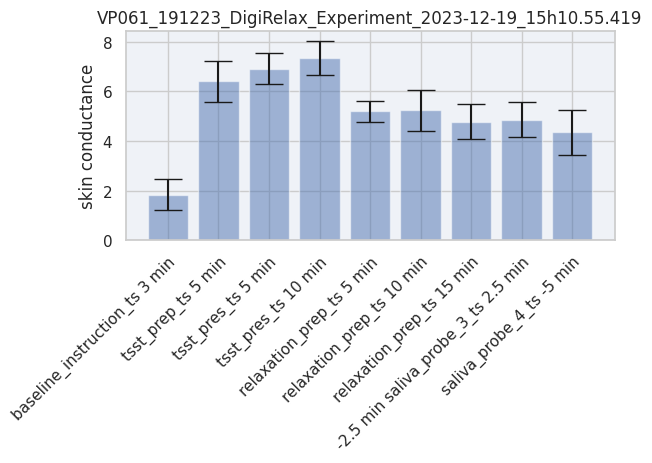

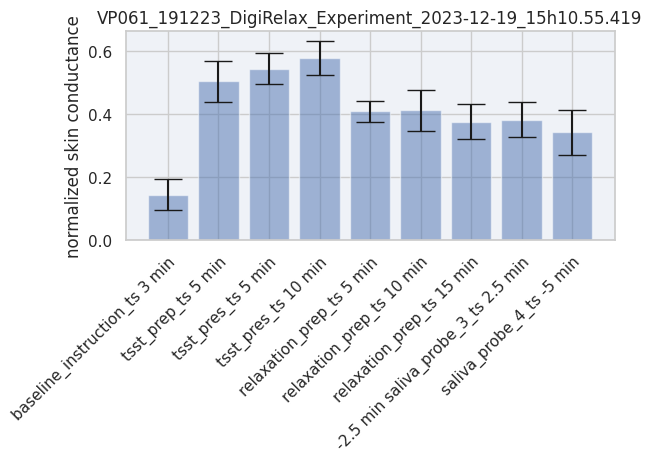

VP062_211223_DigiRelax_Experiment_2023-12-21_13h19.57.826
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


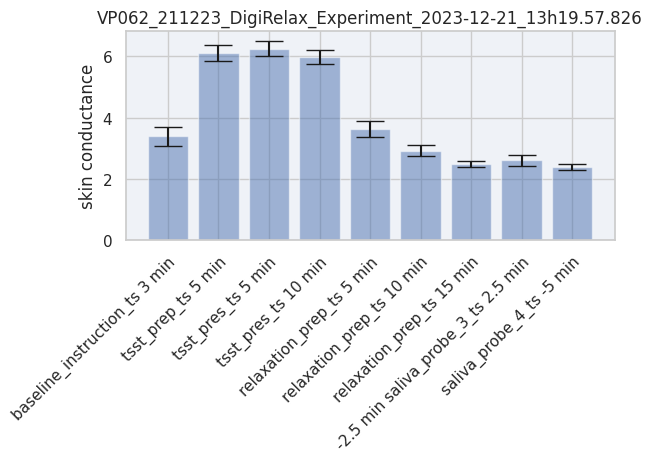

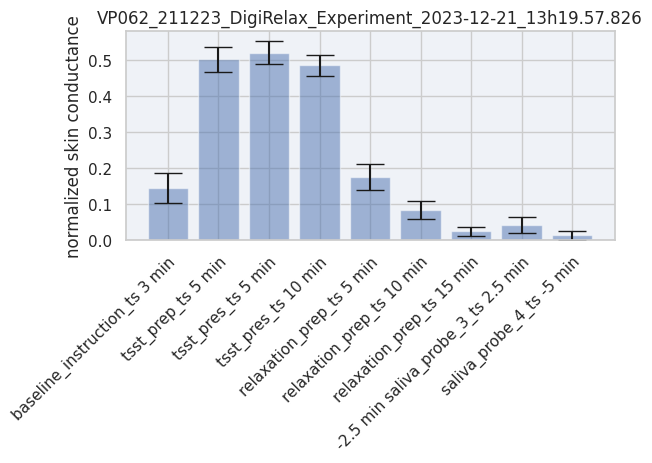

VP063_040124_DigiRelax_Experiment_2024-01-04_14h59.12.423
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


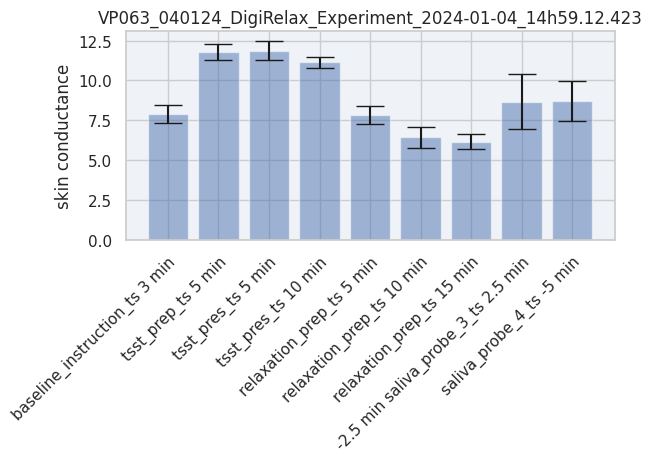

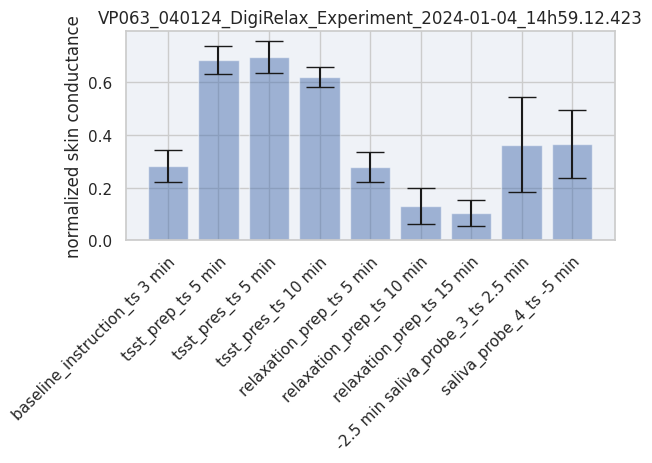

VP064_050124_DigiRelax_Experiment_2024-01-05_09h44.11.070
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


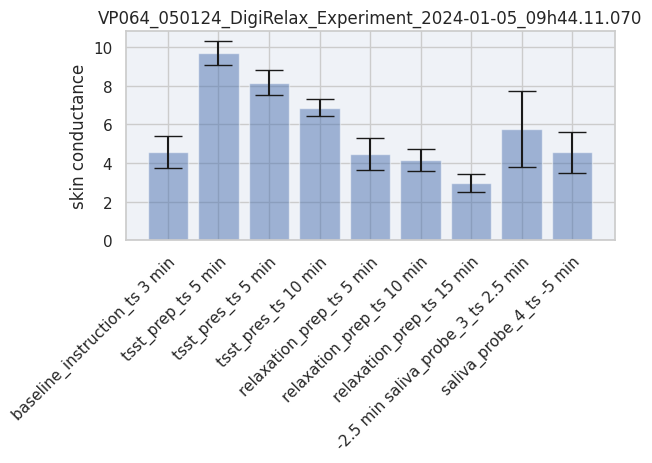

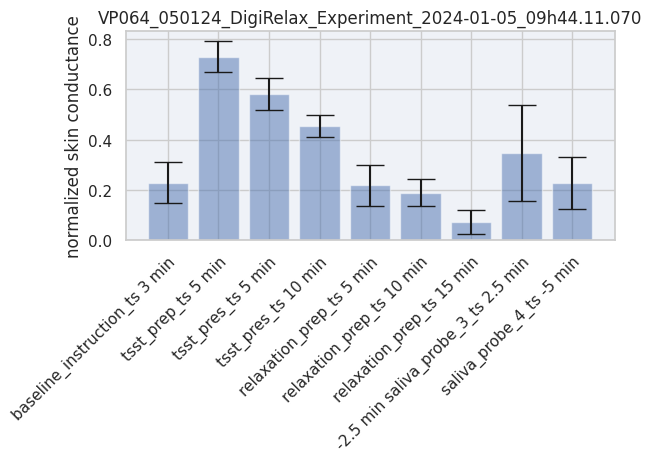

VP065_050124_DigiRelax_Experiment_2024-01-05_14h41.28.548
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


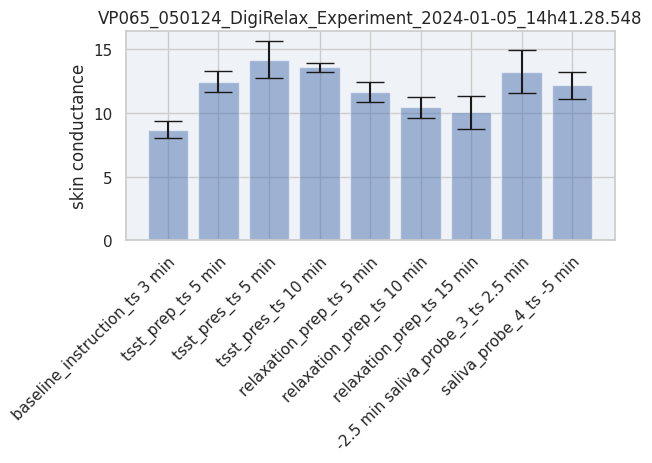

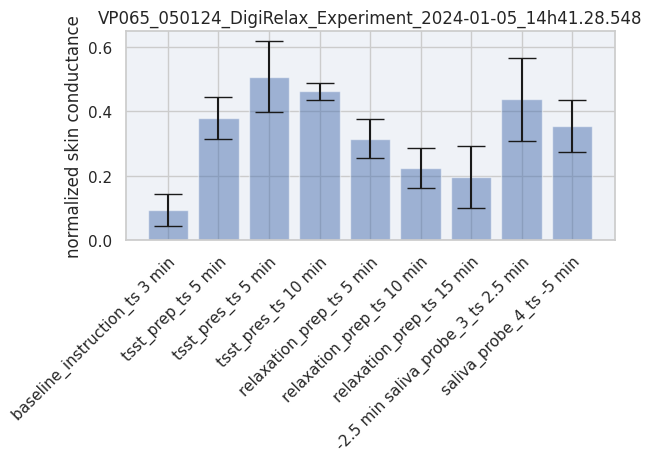

VP066_080124_DigiRelax_Experiment_2024-01-08_13h36.32.476
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


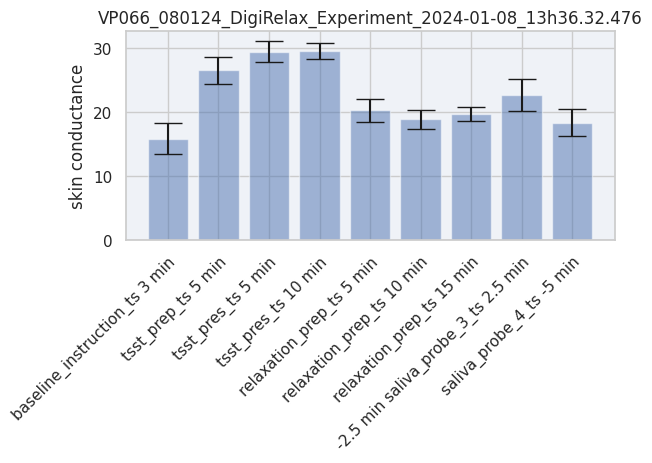

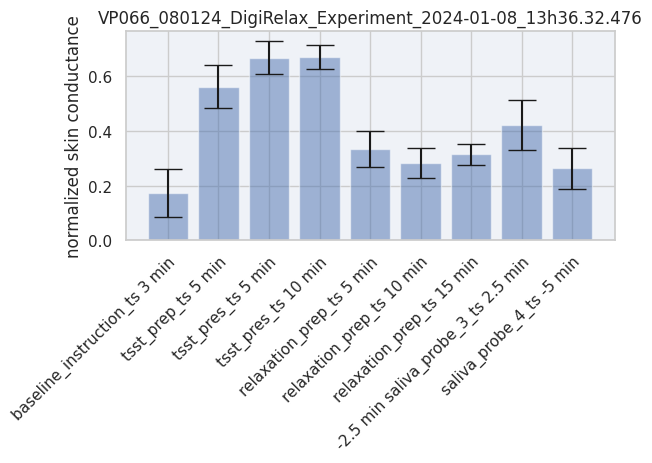

VP067_100124_DigiRelax_Experiment_2024-01-10_09h51.01.071
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


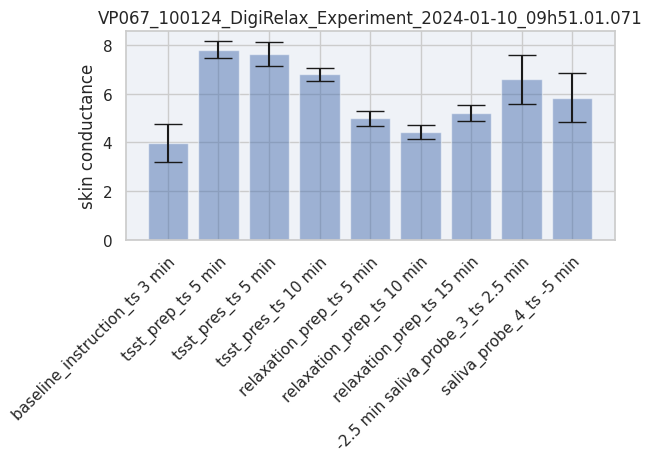

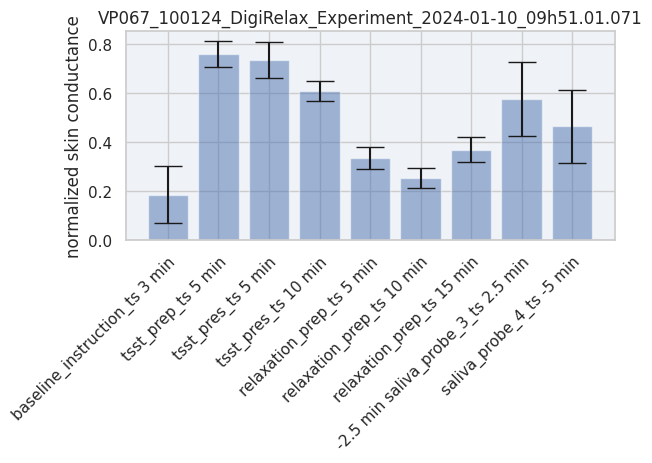

VP068_100124_DigiRelax_Experiment_2024-01-10_14h41.55.244
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


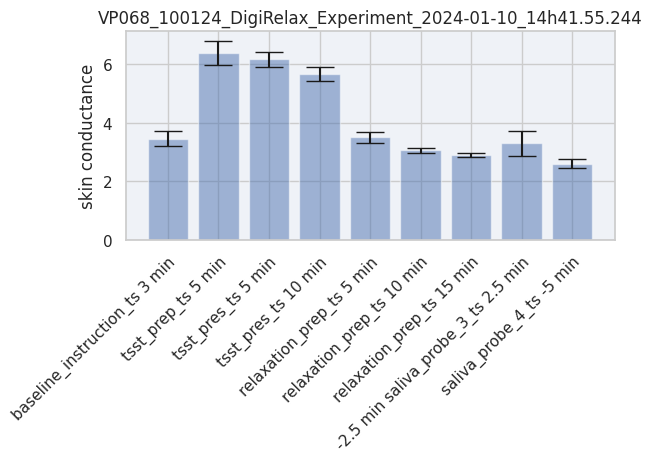

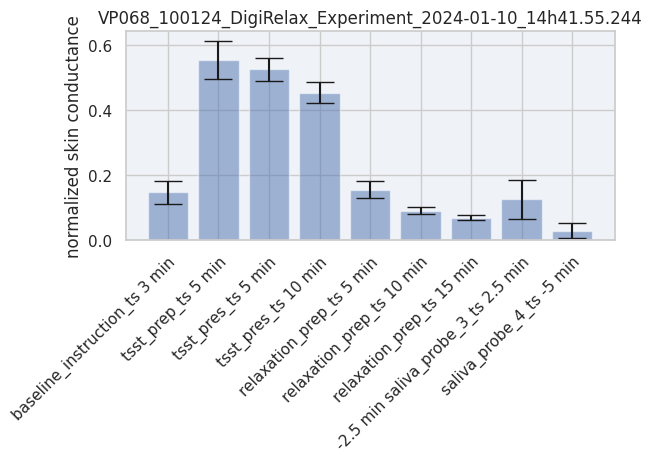

VP069_110124_DigiRelax_Experiment_2024-01-11_09h51.14.639
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


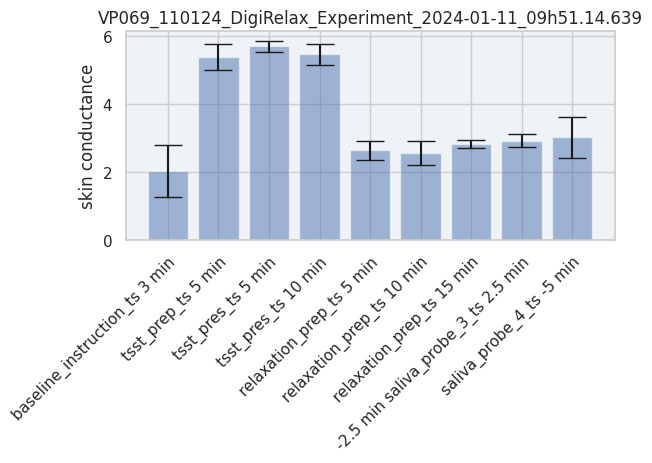

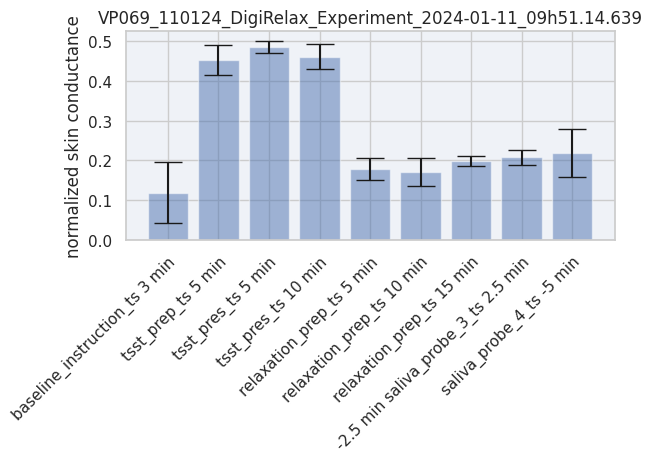

VP070_110124_DigiRelax_Experiment_2024-01-11_14h48.50.074
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


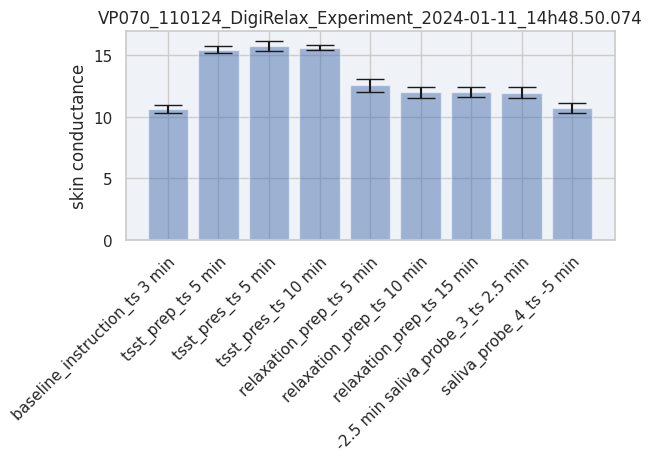

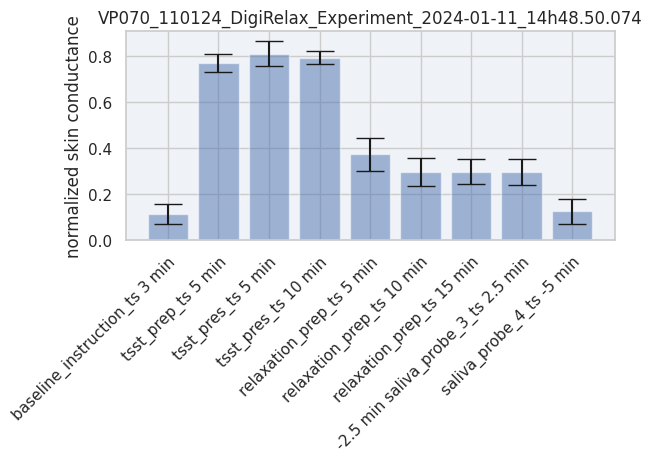

VP071_120124_DigiRelax_Experiment_2024-01-12_09h48.13.466
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


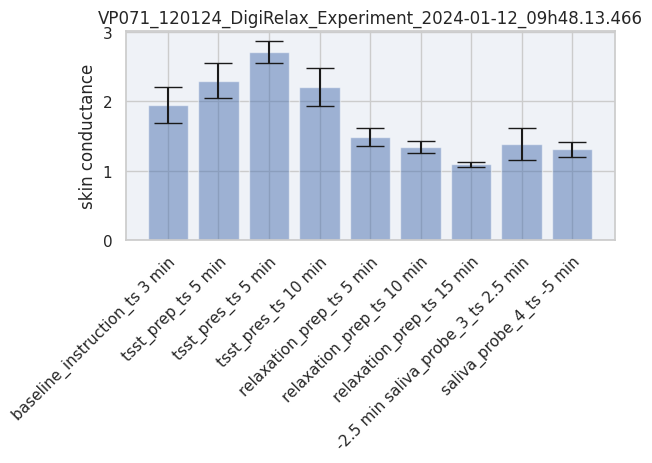

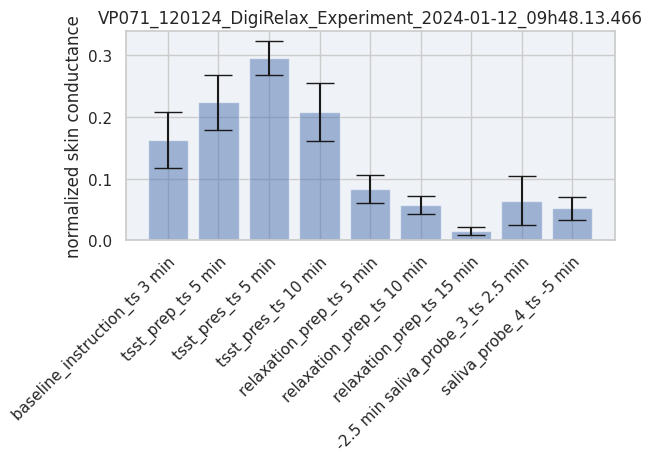

VP072_120124_DigiRelax_Experiment_2024-01-12_14h45.23.547
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


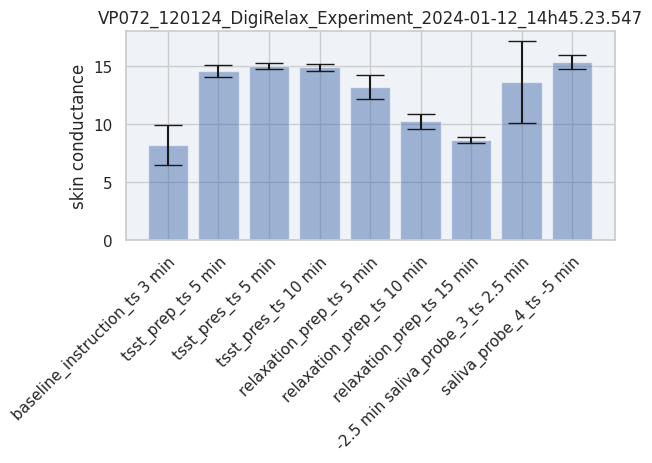

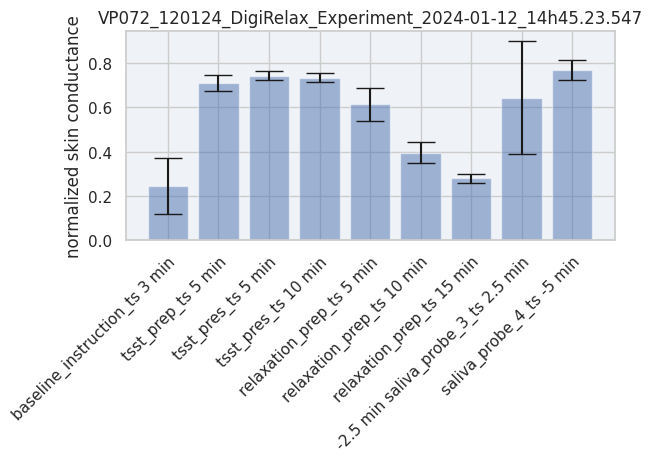

VP073_150124_DigiRelax_Experiment_2024-01-15_10h17.11.190
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


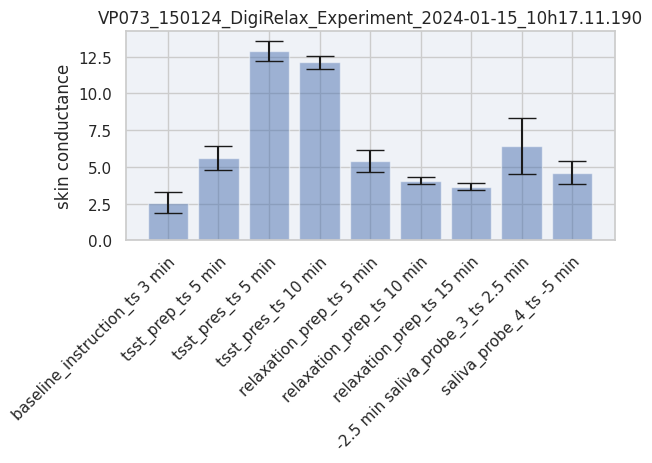

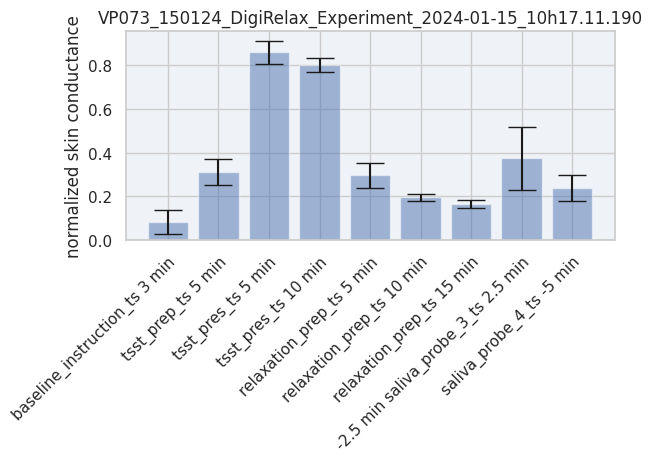

VP074_170124_DigiRelax_Experiment_2024-01-17_09h52.17.376
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


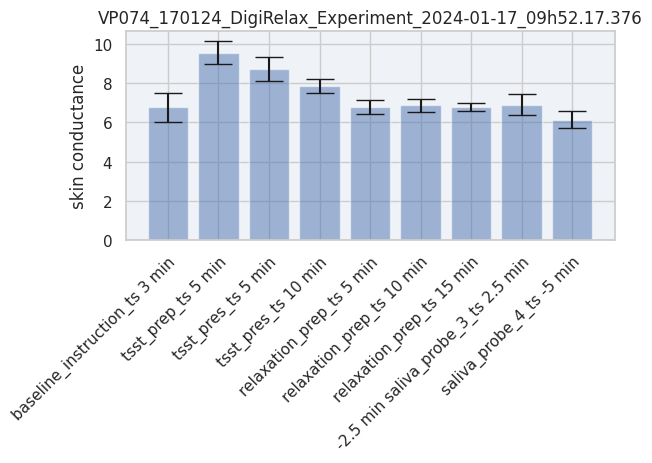

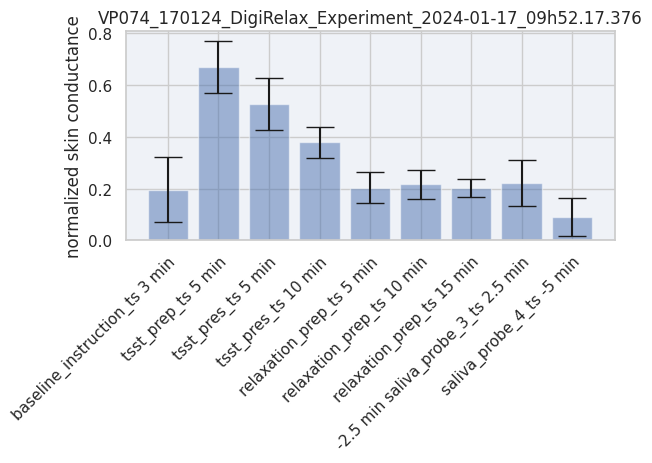

VP075_180124_DigiRelax_Experiment_2024-01-18_09h54.07.734
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


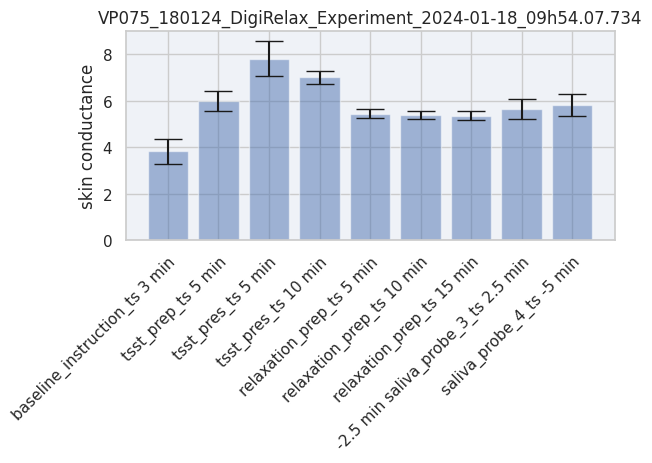

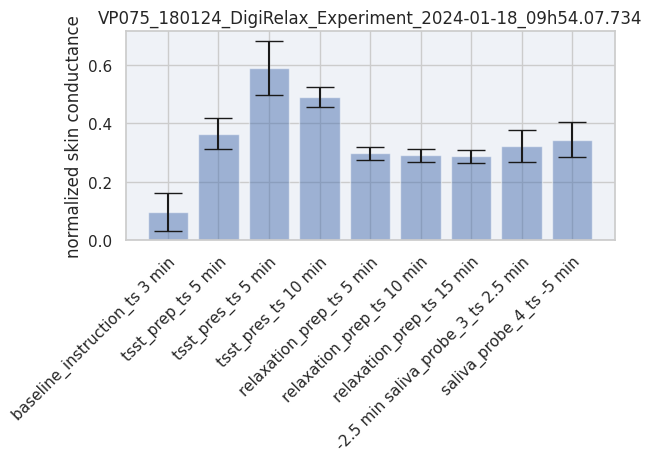

VP076_220124_DigiRelax_Experiment_2024-01-22_14h29.54.037
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


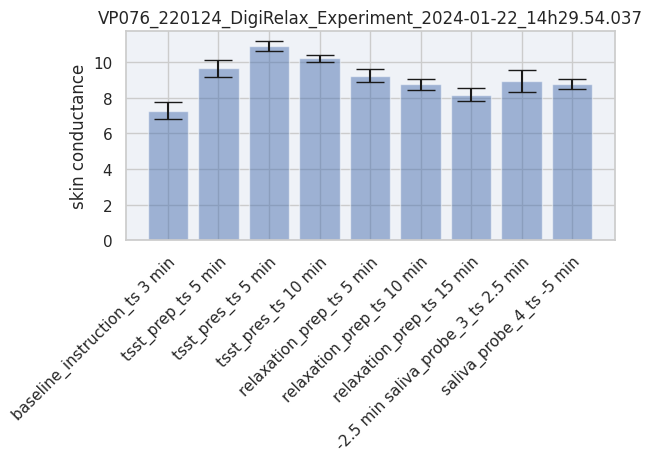

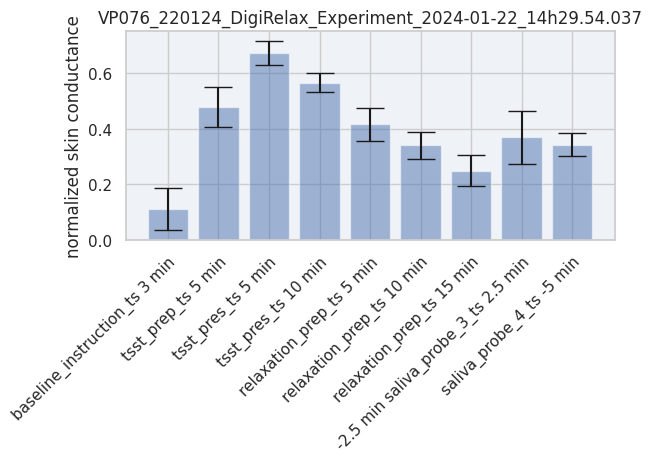

VP077_240124_DigiRelax_Experiment_2024-01-24_09h41.27.985
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


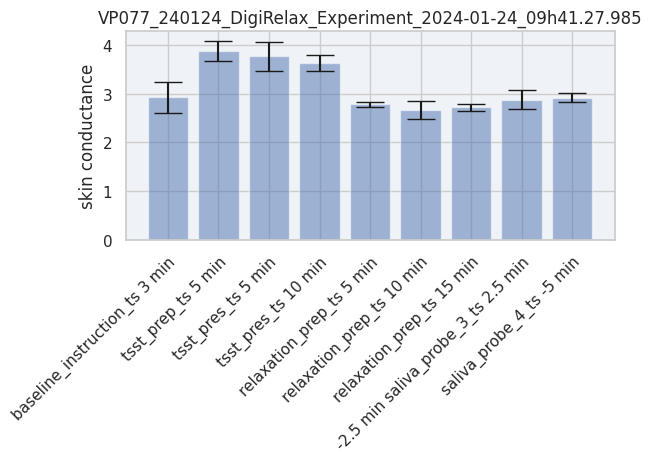

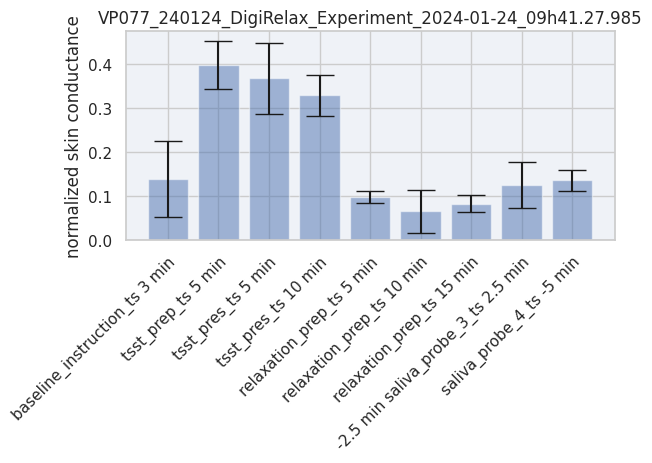

VP078_240124_DigiRelax_Experiment_2024-01-24_14h45.04.447
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


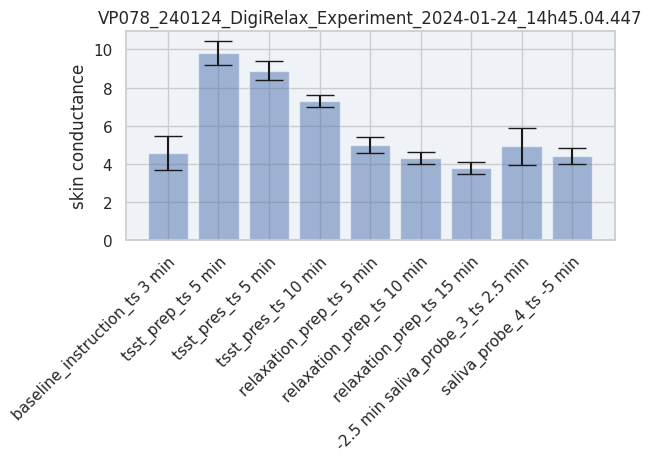

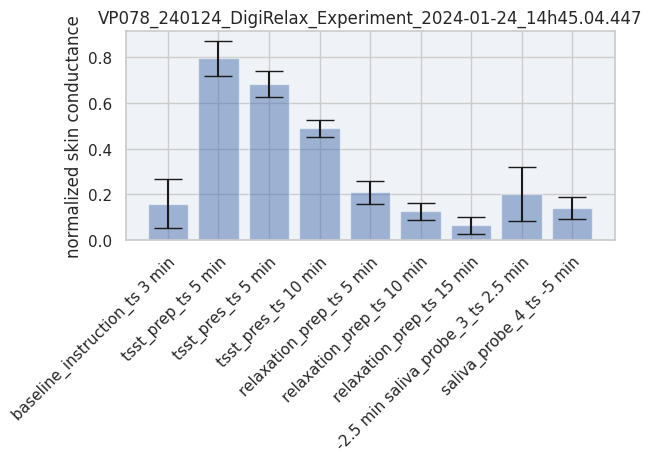

VP079_250124_DigiRelax_Experiment_2024-01-25_11h20.02.642
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


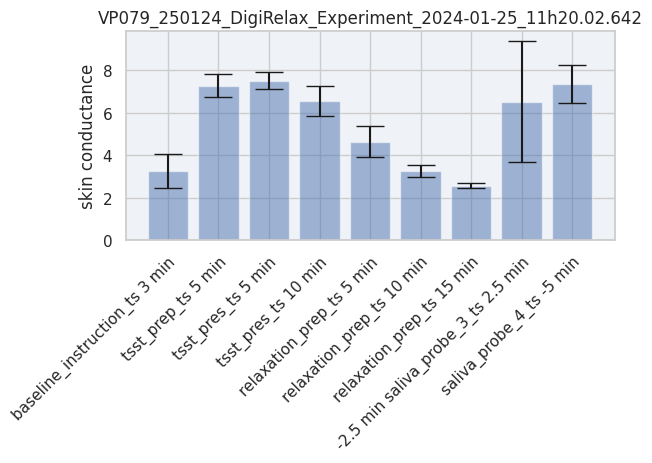

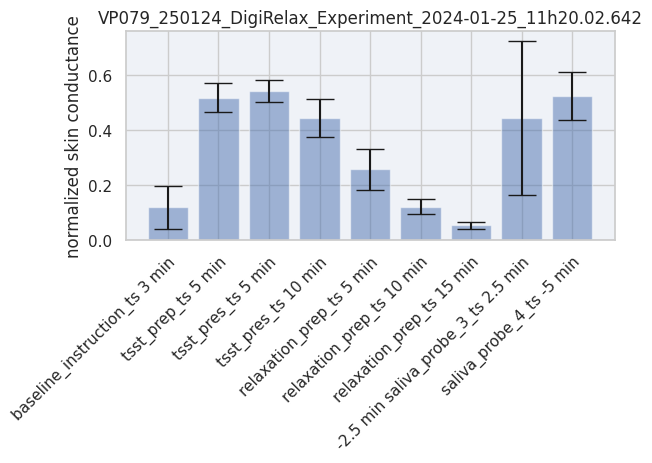

VP080_250124_DigiRelax_Experiment_2024-01-25_14h58.20.993
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


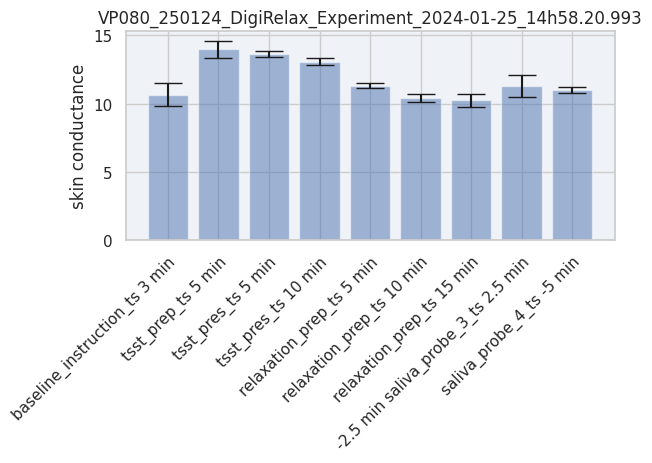

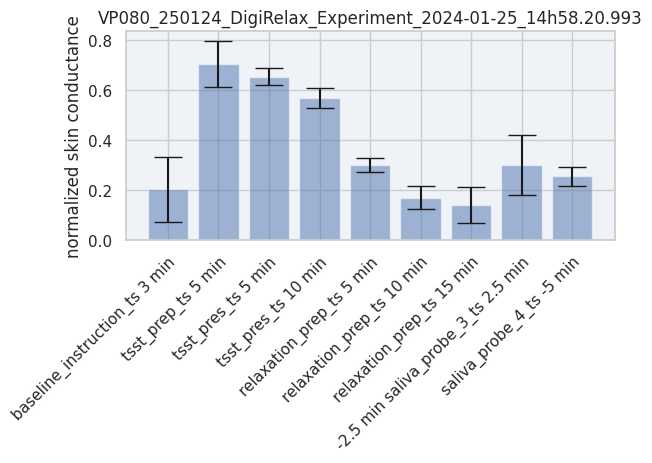

VP081_260124_DigiRelax_Experiment_2024-01-26_10h25.25.740
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


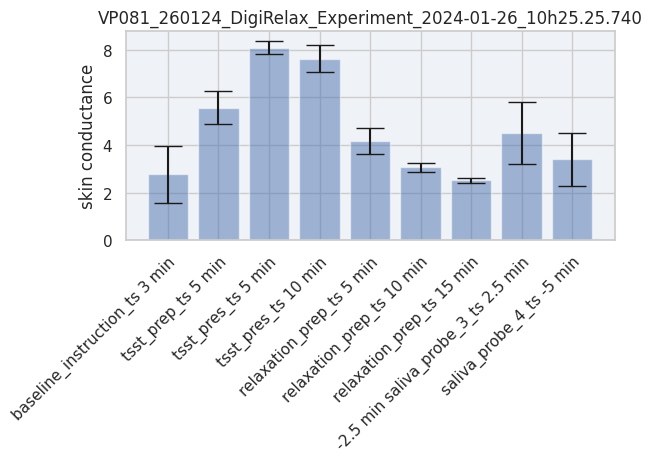

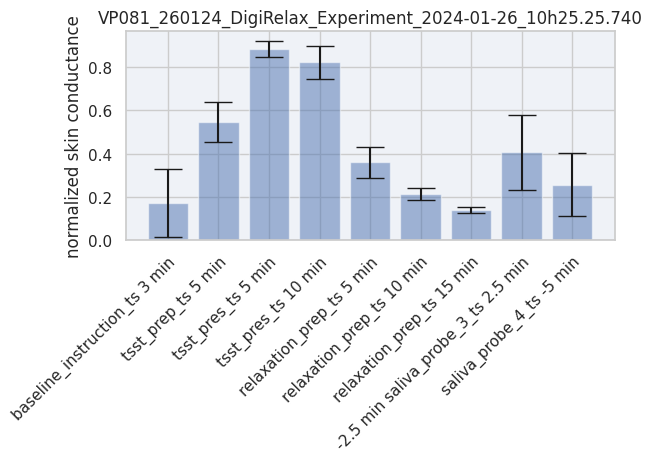

VP083_310124_DigiRelax_Experiment_2024-01-31_09h50.52.785
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


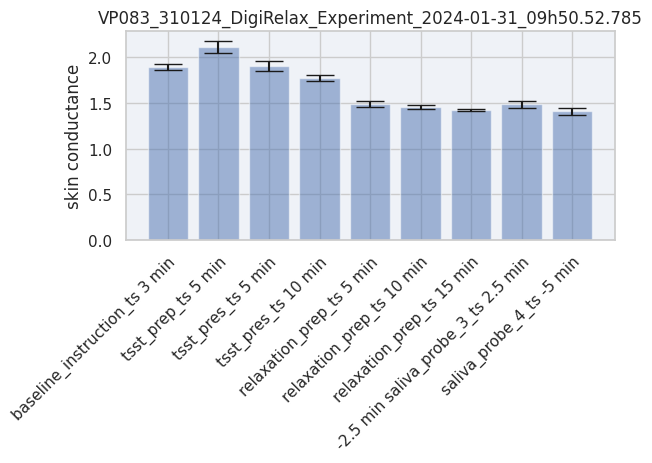

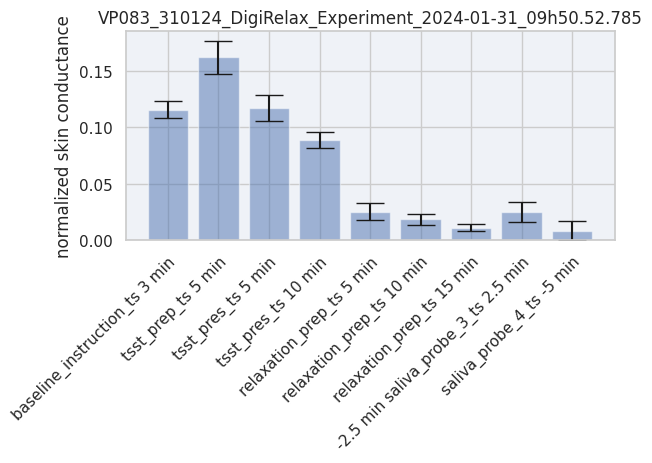

VP084_310124_DigiRelax_Experiment_2024-01-31_13h14.59.762
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


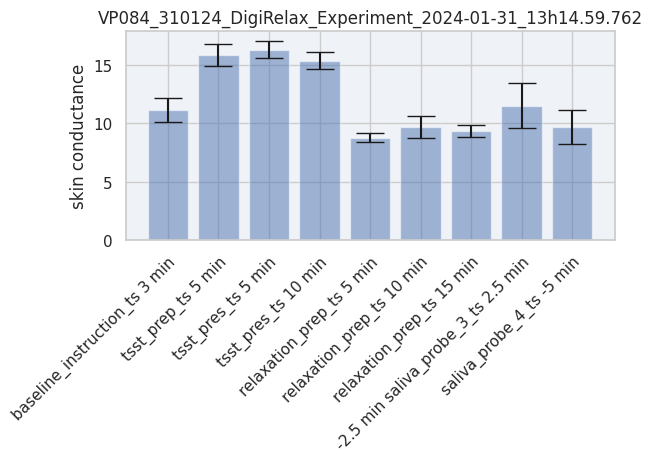

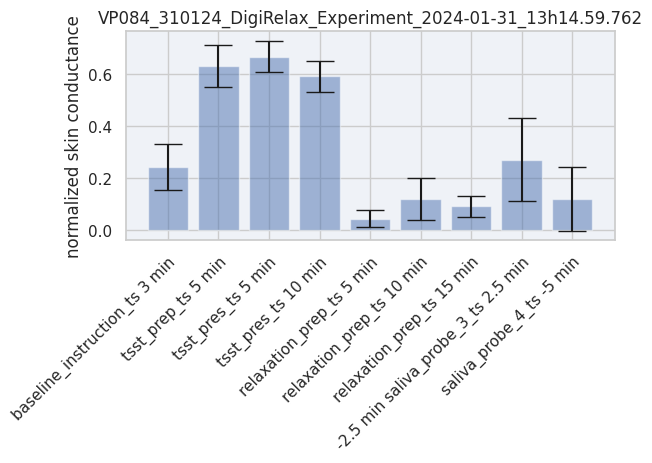

VP085_010224_DigiRelax_Experiment_2024-02-01_09h49.30.242
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


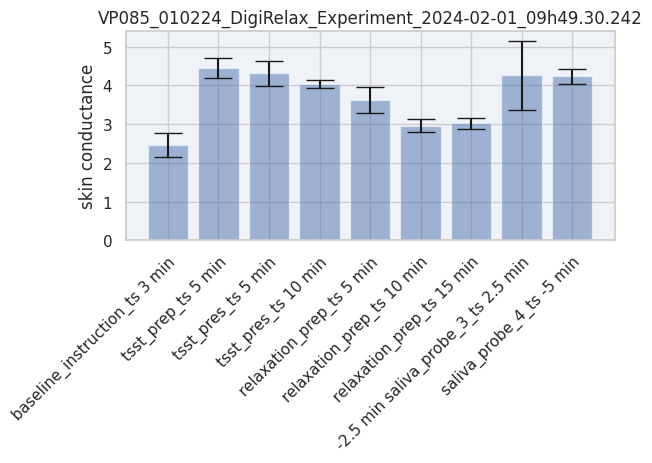

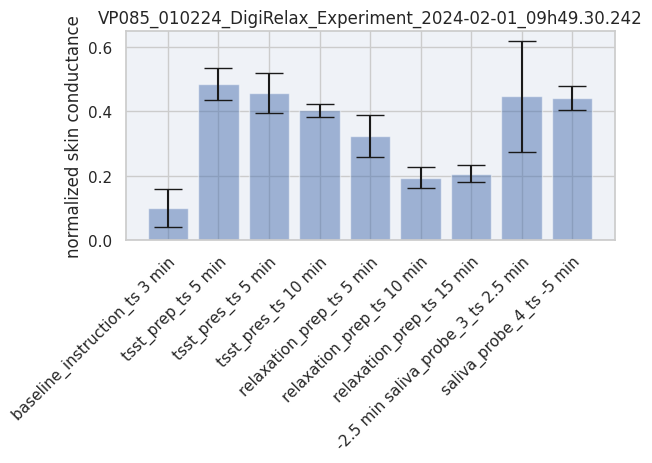

VP086_010224_DigiRelax_Experiment_2024-02-01_14h19.56.788
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts
baseline_instruction_ts
tsst_prep_ts
tsst_pres_ts
relaxation_prep_ts
saliva_probe_3_ts
-2.5 min saliva_probe_3_ts 2.5 min
saliva_probe_4_ts


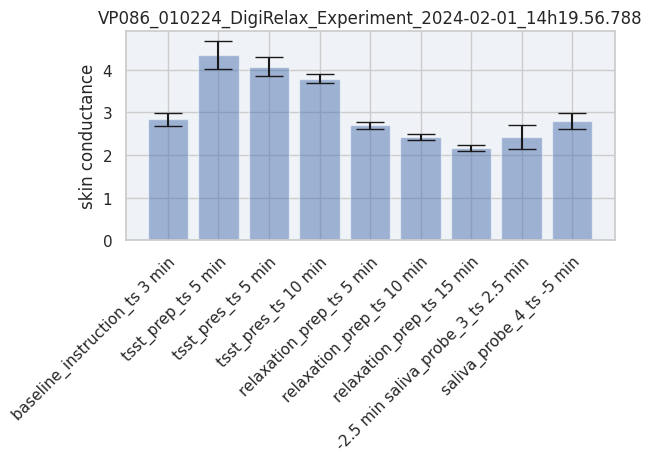

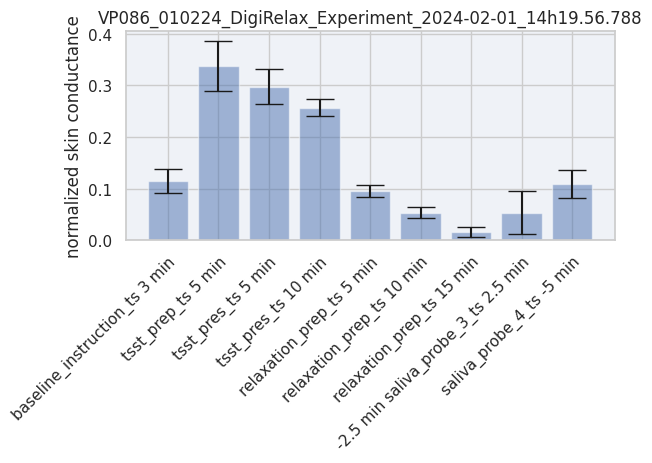

In [8]:


for sub_dir in sub_dirs:
    
    sub_dir_path= os.path.join(data_dir_path, sub_dir)
    psychopy_file_path = os.path.join(sub_dir_path, "Psychopy_data")
    psychopy_file_path = glob.glob(psychopy_file_path+ "/*.csv")[0]
    #print(psychopy_file_path)
    
    shimmer_files_subdir = os.path.join(sub_dir_path, "Shimmer_data")
    
    shimmer_files_subdir_subdir_name = next(os.walk(shimmer_files_subdir))[1][0]
    
    shimmer_files_parent_path = os.path.join(shimmer_files_subdir, shimmer_files_subdir_subdir_name)
    
    shimmer_files_name = glob.glob(shimmer_files_parent_path+ "/*.csv")
    
    for sh_file in shimmer_files_name:
        
        if '_6B1E_' in sh_file:
            hr_shimmer_path = sh_file
        elif "_6B17_" in sh_file:
            hr_shimmer_path = sh_file
            
            
            
        elif "_893E_" in sh_file:
            sk_shimmer_path = sh_file
            ## Skin conductance
            timestamp_sensor_skin = "Shimmer_893E_Timestamp_Unix_CAL"
            conductance_col_name = "Shimmer_893E_GSR_Skin_Conductance_CAL"
            
        elif "_A938_" in sh_file:
            
            sk_shimmer_path = sh_file
            ## Skin Conductance
            timestamp_sensor_skin = "Shimmer_A938_Timestamp_Unix_CAL"
            conductance_col_name = "Shimmer_A938_GSR_Skin_Conductance_CAL"
            
            
            
            
    fol_path, file_name=os.path.split(psychopy_file_path)
    sub_id=file_name[:-4]
    print(sub_id)
    
    ## psychop data
    psychopy_df = read_manipulate_psychopy(psychopy_file_path)
    
    
    
    
    sk_cd_df=read_shimmer_sensor(sk_shimmer_path)
    sk_cd_df = standardize_timestamps_shimmer(sk_cd_df, timestamp_sensor_skin)
    sk_cd_df_selected = sk_cd_df[[timestamp_sensor_skin, conductance_col_name]]
    sk_cd_df_selected = sk_cd_df_selected.copy()
    #sk_cd_df_selected=normalize_data (sk_cd_df_selected, conductance_col_name)
    sk_cd_df_selected=normalize_data_min_max (sk_cd_df_selected, conductance_col_name)
    
    ##for normalized data, uncomment the below_line
    
    #if designated_folder == "normalized":
    #    conductance_col_name = "min_max_norm"
    
    mean_sk_cond_list,std_sk_cond_list, x_label_plot_sk =get_mean_std_event_list_new(psychopy_df, sk_cd_df_selected, event_interest_list_new, offset_min_list_new, timestamp_sensor_skin, conductance_col_name)
    norm_mean_sk_cond_list,norm_std_sk_cond_list, x_label_plot_sk =get_mean_std_event_list_new(psychopy_df, sk_cd_df_selected, event_interest_list_new, offset_min_list_new, timestamp_sensor_skin, "min_max_norm")
    fig_sk= plot_mean_std(mean_sk_cond_list, std_sk_cond_list, x_label_plot_sk, sub_id, "skin conductance")
    fig_sk_norm = plot_mean_std(norm_mean_sk_cond_list, norm_std_sk_cond_list, x_label_plot_sk, sub_id, "normalized skin conductance")
    
    
    ## heart rate
    #timestamp_hr_col = "Shimmer_6B1E_Timestamp_Unix_CAL"
    #hr_col_name = "Shimmer_6B1E_ECGtoHR_LL_RA_CAL"
    
    #hr_df=read_shimmer_sensor(hr_shimmer_path)
    #hr_df = standardize_timestamps_shimmer(hr_df, timestamp_hr_col)
    
    #hr_df_selected = hr_df[[timestamp_hr_col, hr_col_name]]
    #hr_df_selected = hr_df_selected.copy()
    #hr_df_selected=normalize_data (hr_df_selected, hr_col_name)
    #hr_df_selected=normalize_data_min_max(hr_df_selected, hr_col_name)
    
    ##for normalized data, uncomment the below_line
    #if designated_folder == "normalized":
    #    hr_col_name = "min_max_norm"
    #hr_col_name="mean_norm"
    
    #mean_hr_list,std_hr_list, x_label_plots_hr =get_mean_std_event_list(psychopy_df, hr_df_selected, event_interest_list_new, offset_min_list_new, timestamp_hr_col, hr_col_name)
    
    #fig_hr=plot_mean_std(mean_hr_list, std_hr_list, x_label_plots_hr, sub_id, "Heart rate from ECG")
    #####---------------------------------------------------------------------------------------------
    ### ----------------------------- Exporting data--------------------------------------------------
    ####-----------------------------------------------------------------------------------------------
    
    export_dict= {"subject_id":sub_id , 'event_interst': x_label_plot_sk, "mean_sk_cond":mean_sk_cond_list , "std_sk_cond": std_sk_cond_list ,
                  "mean_sk_cond_norm":norm_mean_sk_cond_list,  "std_sk_cond_norm": norm_std_sk_cond_list}
    
    dest_path_csv = os.path.join(dest_path,file_name)
    df_export = pd.DataFrame.from_dict(export_dict)
    df_export.to_csv(dest_path_csv)
    
    
    ### save skin conductance figure
    
    sk_file_name = "sk_"+sub_id +".png"
    
    norm_sk_file_name = "norm_sk_"+sub_id +".png"
    
    dest_path_fig_sk = os.path.join(dest_path,sk_file_name)
    fig_sk.savefig(dest_path_fig_sk)
    
    dest_path_fig_norm_sk = os.path.join(dest_path,norm_sk_file_name)
    fig_sk_norm.savefig(dest_path_fig_norm_sk)
    
    ### save heart rate figure
    
    #hr_file_name = "hr_"+sub_id +".png"
    
    #dest_path_fig_hr = os.path.join(comp_dest_path, hr_file_name)
    
    #fig_hr.savefig(dest_path_fig_hr) 

In [ ]:
df=pd.read_csv(sk_anal_path)

In [13]:
df

,Unnamed: 0,subject_id,event_interst,mean_sk_cond,std_sk_cond,mean_sk_cond_norm,std_sk_cond_norm
0,0,VP004_081123_DigiRelax_Experiment_2023-11-08_1...,baseline_instruction_ts 3 min,3.016069,0.407156,0.176144,0.045198
1,1,VP004_081123_DigiRelax_Experiment_2023-11-08_1...,tsst_prep_ts 5 min,4.115531,0.263664,0.298193,0.029269
2,2,VP004_081123_DigiRelax_Experiment_2023-11-08_1...,tsst_pres_ts 5 min,4.125311,0.335520,0.299279,0.037246
3,3,VP004_081123_DigiRelax_Experiment_2023-11-08_1...,tsst_pres_ts 10 min,4.317486,0.247893,0.320612,0.027518
4,4,VP004_081123_DigiRelax_Experiment_2023-11-08_1...,relaxation_prep_ts 5 min,3.525411,0.704878,0.232685,0.078247
5,5,VP004_081123_DigiRelax_Experiment_2023-11-08_1...,relaxation_prep_ts 10 min,2.255158,0.224424,0.091677,0.024913
6,6,VP004_081123_DigiRelax_Experiment_2023-11-08_1...,relaxation_prep_ts 15 min,1.671266,0.138734,0.026860,0.015401
